# OVERVIEW

*Auto insurance, which is a contract between two parties, the insurance company and the insured customer, protects the insured against financial loss in the event of an accident or theft, as listed in the policy, in exchange for a premium being paid by the customer. In recent years, due to sporadic increase in vehicle owners, auto insurance has become very popular as the most profitable type of insurance next to health insurance. Most states in the United States require basic auto insurance for vehicles to be operated.* 

*Many insurance companies provide different types of insurance and customers may get their different insurance coverages from one company or different ones for each insurance type. It is important for these companies to understand and be able to identify which of their customers would be willing to get a different kind of insurance with them and how they can get the customers to do so. One of the ways to do this could be offering each existing customer discounted rates if they will buy these other insurance coverages.*

*This study will take a look at the existing relationships among gender, age, sales channel and number of days the customers have been associated with the company to predict their potential responses.* 

### Problem Statement

Which health insurance customers from the past year are likely to be interested in vehicle insurance?

### Specifications

For excellent analysis and prediction, the project will focus on demographic information like “Age”, "Gender”, etc, as well as vehicular information and policy types to determine which existing health insurance customers will be interested in auto insurance using predictive models built through machine learning.

This project will help stakeholders, management and decision makers of insurance companies track, analyse and assess the likelihood of getting potential vehicle insurance customers from the existing health insurance owners, thereby helping them plan their communication strategies to reach out to those customers, which will, in turn, optimize their business models and revenues. Machine learning models that will help make these predictions will be built. The project will look to provide answers to the following alternative questions amongst others:

(1) Apart from rates, what other factors influence customers’ insurance providers decisions?

(2) Why are there vast disparities among rates of different insurance companies?

(3) What factors are used to determine rates for each customer?

### Data Collection

CSV-formatted health insurance test and train data with combined rows of five hundred and eight thousand, one hundred and forty-six and twenty-three columns from Kaggle will be used for this project. The dataset gives detailed information about the customers, as well as vehicular and policy information.  The data usability is 10.0. Here is a link to the dataset. 



### Data Processing, Preparation and Feature Engineering

The dataset does not have any missing values, but regular review will be done to make sure the data is in great shape. Data profiling and data mining will be done to get comprehensive information about the data and check for further defects. If there are any outliers, they will be capped with percentiles or replaced with the median values of their respective columns, depending on what percentages are missing.

### Machine Learning: Model Selection 

XGBoost, RandomForestClassifier, Gaussian Mixture Clusters and some other models will be used for the project. Train-Test Split will be used to test the model performance and cross-validation will be used to test the model’s performance.


# DATA WRANGLING.

### Importing The Necessary Packages

In [1]:
import pandas as pd
import seaborn as sns
import os
from math import log
import numpy as np
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import MultinomialNB,BernoulliNB
from sklearn.ensemble import RandomForestClassifier,AdaBoostClassifier,GradientBoostingClassifier
import pickle
from sklearn import __version__ as sklearn_version
from sklearn.model_selection import cross_validate, cross_val_score
from sklearn import metrics
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error


from sklearn.feature_selection import RFE
from mlxtend.feature_selection import SequentialFeatureSelector



from sklearn.model_selection import RandomizedSearchCV
import xgboost as xgb
import lightgbm as lgb
from xgboost import XGBClassifier
from sklearn.model_selection import StratifiedKFold, KFold, GridSearchCV
from sklearn.metrics import f1_score, roc_auc_score, accuracy_score, confusion_matrix, auc, roc_curve, recall_score, classification_report

import statsmodels.api as sm
import plotly.express as px
from statsmodels.formula.api import ols
%matplotlib inline
from sklearn.decomposition import PCA
from sklearn.preprocessing import scale
from sklearn.metrics import precision_score, precision_recall_curve
from sklearn.naive_bayes import GaussianNB
from termcolor import colored as cl # text customization
import seaborn as sb # visualization

from sklearn.preprocessing import StandardScaler, PowerTransformer, PolynomialFeatures, OneHotEncoder

from sklearn.model_selection import train_test_split # data split

from sklearn.linear_model import LinearRegression # OLS algorithm
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import Ridge # Ridge algorithm
from sklearn.linear_model import Lasso # Lasso algorithm
from sklearn.linear_model import BayesianRidge # Bayesian algorithm
from sklearn.linear_model import ElasticNet # ElasticNet algorithm

from sklearn.metrics import explained_variance_score as evs # evaluation metric
from sklearn.metrics import r2_score as r2 # evaluation metric

from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf

from imblearn.under_sampling import RandomUnderSampler, NearMiss
from imblearn.combine import SMOTEENN, SMOTETomek
from imblearn.over_sampling import RandomOverSampler, SMOTE, SMOTENC


plt.rcParams['figure.figsize'] = (20, 10) # plot size

sns.set(style='ticks')
sb.set_style('whitegrid') # plot style
plt.rcParams['figure.figsize'] = (20, 10) # plot size



### Importing The Data

In [2]:
insurance_data_train = pd.read_csv('train.csv')

In [3]:
insurance_data_train.shape

(381109, 12)

In [4]:
insurance_data_test = pd.read_csv('test.csv')

In [5]:
insurance_data_test.shape

(127037, 11)

In [6]:
insurance_data_train.head()

,id,Gender,Age,Driving_License,Region_Code,Previously_Insured,Vehicle_Age,Vehicle_Damage,Annual_Premium,Policy_Sales_Channel,Vintage,Response
0,1,Male,44,1,28.0,0,> 2 Years,Yes,40454.0,26.0,217,1
1,2,Male,76,1,3.0,0,1-2 Year,No,33536.0,26.0,183,0
2,3,Male,47,1,28.0,0,> 2 Years,Yes,38294.0,26.0,27,1
3,4,Male,21,1,11.0,1,< 1 Year,No,28619.0,152.0,203,0
4,5,Female,29,1,41.0,1,< 1 Year,No,27496.0,152.0,39,0


Replacing "Male" and "Female" with "1" and "0" respectively for "Gender"; "Yes" and "No" with "1" and "0" respectively for "Vehicle_Damage"; "> 2 Years", "1-2 Year", "< 1 Year" with "2", "1" and "0" respectively for "Vehicle_Age"  

In [7]:
insurance_data_train['Vehicle_Damage'] = insurance_data_train['Vehicle_Damage'].map({'Yes': 1, 'No':0})
insurance_data_train['Gender'] = insurance_data_train['Gender'].map({'Male': 1, 'Female': 0})
insurance_data_train['Vehicle_Age'] = insurance_data_train["Vehicle_Age"].map({'> 2 Years': 2, '1-2 Year': 1,"< 1 Year":0})

In [8]:
insurance_data_train.head()

,id,Gender,Age,Driving_License,Region_Code,Previously_Insured,Vehicle_Age,Vehicle_Damage,Annual_Premium,Policy_Sales_Channel,Vintage,Response
0,1,1,44,1,28.0,0,2,1,40454.0,26.0,217,1
1,2,1,76,1,3.0,0,1,0,33536.0,26.0,183,0
2,3,1,47,1,28.0,0,2,1,38294.0,26.0,27,1
3,4,1,21,1,11.0,1,0,0,28619.0,152.0,203,0
4,5,0,29,1,41.0,1,0,0,27496.0,152.0,39,0


In [9]:
insurance_data_test.head()

,id,Gender,Age,Driving_License,Region_Code,Previously_Insured,Vehicle_Age,Vehicle_Damage,Annual_Premium,Policy_Sales_Channel,Vintage
0,381110,Male,25,1,11.0,1,< 1 Year,No,35786.0,152.0,53
1,381111,Male,40,1,28.0,0,1-2 Year,Yes,33762.0,7.0,111
2,381112,Male,47,1,28.0,0,1-2 Year,Yes,40050.0,124.0,199
3,381113,Male,24,1,27.0,1,< 1 Year,Yes,37356.0,152.0,187
4,381114,Male,27,1,28.0,1,< 1 Year,No,59097.0,152.0,297


In [10]:
insurance_data_test['Vehicle_Damage'] = insurance_data_test['Vehicle_Damage'].map({'Yes': 1, 'No':0})
insurance_data_test['Gender'] = insurance_data_test['Gender'].map({'Male': 1, 'Female': 0})
insurance_data_test['Vehicle_Age'] = insurance_data_test["Vehicle_Age"].map({'> 2 Years': 2, '1-2 Year': 1,"< 1 Year":0})

In [11]:
insurance_data_test.head()

,id,Gender,Age,Driving_License,Region_Code,Previously_Insured,Vehicle_Age,Vehicle_Damage,Annual_Premium,Policy_Sales_Channel,Vintage
0,381110,1,25,1,11.0,1,0,0,35786.0,152.0,53
1,381111,1,40,1,28.0,0,1,1,33762.0,7.0,111
2,381112,1,47,1,28.0,0,1,1,40050.0,124.0,199
3,381113,1,24,1,27.0,1,0,1,37356.0,152.0,187
4,381114,1,27,1,28.0,1,0,0,59097.0,152.0,297


In [12]:
insurance_data_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 381109 entries, 0 to 381108
Data columns (total 12 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   id                    381109 non-null  int64  
 1   Gender                381109 non-null  int64  
 2   Age                   381109 non-null  int64  
 3   Driving_License       381109 non-null  int64  
 4   Region_Code           381109 non-null  float64
 5   Previously_Insured    381109 non-null  int64  
 6   Vehicle_Age           381109 non-null  int64  
 7   Vehicle_Damage        381109 non-null  int64  
 8   Annual_Premium        381109 non-null  float64
 9   Policy_Sales_Channel  381109 non-null  float64
 10  Vintage               381109 non-null  int64  
 11  Response              381109 non-null  int64  
dtypes: float64(3), int64(9)
memory usage: 34.9 MB


In [13]:
insurance_data_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 127037 entries, 0 to 127036
Data columns (total 11 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   id                    127037 non-null  int64  
 1   Gender                127037 non-null  int64  
 2   Age                   127037 non-null  int64  
 3   Driving_License       127037 non-null  int64  
 4   Region_Code           127037 non-null  float64
 5   Previously_Insured    127037 non-null  int64  
 6   Vehicle_Age           127037 non-null  int64  
 7   Vehicle_Damage        127037 non-null  int64  
 8   Annual_Premium        127037 non-null  float64
 9   Policy_Sales_Channel  127037 non-null  float64
 10  Vintage               127037 non-null  int64  
dtypes: float64(3), int64(8)
memory usage: 10.7 MB


In [14]:
insurance_data_train.columns

Index(['id', 'Gender', 'Age', 'Driving_License', 'Region_Code',
       'Previously_Insured', 'Vehicle_Age', 'Vehicle_Damage', 'Annual_Premium',
       'Policy_Sales_Channel', 'Vintage', 'Response'],
      dtype='object')

In [15]:
insurance_data_test.columns

Index(['id', 'Gender', 'Age', 'Driving_License', 'Region_Code',
       'Previously_Insured', 'Vehicle_Age', 'Vehicle_Damage', 'Annual_Premium',
       'Policy_Sales_Channel', 'Vintage'],
      dtype='object')

In [17]:
insurance_data_train.select_dtypes(include=np.object).nunique()

Series([], dtype: float64)

# EXPLORATORY DATA ANALYSIS.

In [18]:
insurance_data_train.isnull().sum().sum()

0

In [19]:
insurance_data_test.isnull().sum().sum()

0

In [20]:
missing = pd.concat([insurance_data_train.isnull().sum(axis=1), 100 * insurance_data_train.isnull().mean(axis=1)], axis=1)
missing.columns=['count','%']
missing.sort_values(by='count', ascending = True)

,count,%
0,0,0.0
254077,0,0.0
254076,0,0.0
254075,0,0.0
254074,0,0.0
...,...,...
127031,0,0.0
127030,0,0.0
127029,0,0.0
127038,0,0.0


In [21]:
missing = pd.concat([insurance_data_test.isnull().sum(axis=1), 100 * insurance_data_test.isnull().mean(axis=1)], axis=1)
missing.columns=['count','%']
missing.sort_values(by='count', ascending = True)

,count,%
0,0,0.0
84698,0,0.0
84697,0,0.0
84696,0,0.0
84695,0,0.0
...,...,...
42338,0,0.0
42337,0,0.0
42336,0,0.0
42349,0,0.0


In [16]:
duplicates = insurance_data_train.duplicated()
print(duplicates)

0         False
1         False
2         False
3         False
4         False
          ...  
381104    False
381105    False
381106    False
381107    False
381108    False
Length: 381109, dtype: bool


In [22]:
insurance_data_train.describe()

,id,Gender,Age,Driving_License,Region_Code,Previously_Insured,Vehicle_Age,Vehicle_Damage,Annual_Premium,Policy_Sales_Channel,Vintage,Response
count,381109.000000,381109.000000,381109.000000,381109.000000,381109.000000,381109.000000,381109.000000,381109.000000,381109.000000,381109.000000,381109.000000,381109.000000
mean,190555.000000,0.540761,38.822584,0.997869,26.388807,0.458210,0.609616,0.504877,30564.389581,112.034295,154.347397,0.122563
std,110016.836208,0.498336,15.511611,0.046110,13.229888,0.498251,0.567439,0.499977,17213.155057,54.203995,83.671304,0.327936
min,1.000000,0.000000,20.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2630.000000,1.000000,10.000000,0.000000
25%,95278.000000,0.000000,25.000000,1.000000,15.000000,0.000000,0.000000,0.000000,24405.000000,29.000000,82.000000,0.000000
50%,190555.000000,1.000000,36.000000,1.000000,28.000000,0.000000,1.000000,1.000000,31669.000000,133.000000,154.000000,0.000000
75%,285832.000000,1.000000,49.000000,1.000000,35.000000,1.000000,1.000000,1.000000,39400.000000,152.000000,227.000000,0.000000
max,381109.000000,1.000000,85.000000,1.000000,52.000000,1.000000,2.000000,1.000000,540165.000000,163.000000,299.000000,1.000000


In [23]:
insurance_data_test.describe()

,id,Gender,Age,Driving_License,Region_Code,Previously_Insured,Vehicle_Age,Vehicle_Damage,Annual_Premium,Policy_Sales_Channel,Vintage
count,127037.000000,127037.000000,127037.000000,127037.000000,127037.000000,127037.000000,127037.000000,127037.000000,127037.000000,127037.000000,127037.000000
mean,444628.000000,0.537135,38.765903,0.998134,26.459866,0.460039,0.608775,0.502491,30524.643576,111.800468,154.318301
std,36672.567411,0.498621,15.465814,0.043152,13.209916,0.498403,0.567371,0.499996,16945.297103,54.371765,83.661588
min,381110.000000,0.000000,20.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2630.000000,1.000000,10.000000
25%,412869.000000,0.000000,25.000000,1.000000,15.000000,0.000000,0.000000,0.000000,24325.000000,26.000000,82.000000
50%,444628.000000,1.000000,36.000000,1.000000,28.000000,0.000000,1.000000,1.000000,31642.000000,135.000000,154.000000
75%,476387.000000,1.000000,49.000000,1.000000,35.000000,1.000000,1.000000,1.000000,39408.000000,152.000000,227.000000
max,508146.000000,1.000000,85.000000,1.000000,52.000000,1.000000,2.000000,1.000000,472042.000000,163.000000,299.000000


In [24]:
import requests
  
class Currency_convertor:
    # empty dict to store the conversion rates
    rates = {} 
    def __init__(self, url):
        data = requests.get(url).json()
  
        # Extracting only the rates from the json data
        self.rates = data["rates"] 
  
    # function to do a simple cross multiplication between 
    # the amount and the conversion rates
    def convert(self, from_currency, to_currency, amount):
        initial_amount = amount
        if from_currency != 'EUR' :
            amount = amount / self.rates[from_currency]
  
        # limiting the precision to 2 decimal places
        amount = round(amount * self.rates[to_currency], 2)
        print('{} {} = {} {}'.format(initial_amount, from_currency, amount, to_currency))
  
# Driver code
if __name__ == "__main__":
  
    url = str.__add__('http://data.fixer.io/api/latest?access_key=' ,'cec8764d43ea7597625dda7954a9758c')  
    c = Currency_convertor(url)
    from_country = input("From Country: ")
    to_country = input("TO Country: ")
    amount = int(input("Amount: "))
  
    c.convert(from_country, to_country, amount)

From Country: INR
TO Country: USD
Amount: 1
1 INR = 0.01 USD


In [25]:
#Remember to remove the API key in the above code before posting on GITHUB

*Checking for outliers.*

/Users/dambrielf67/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


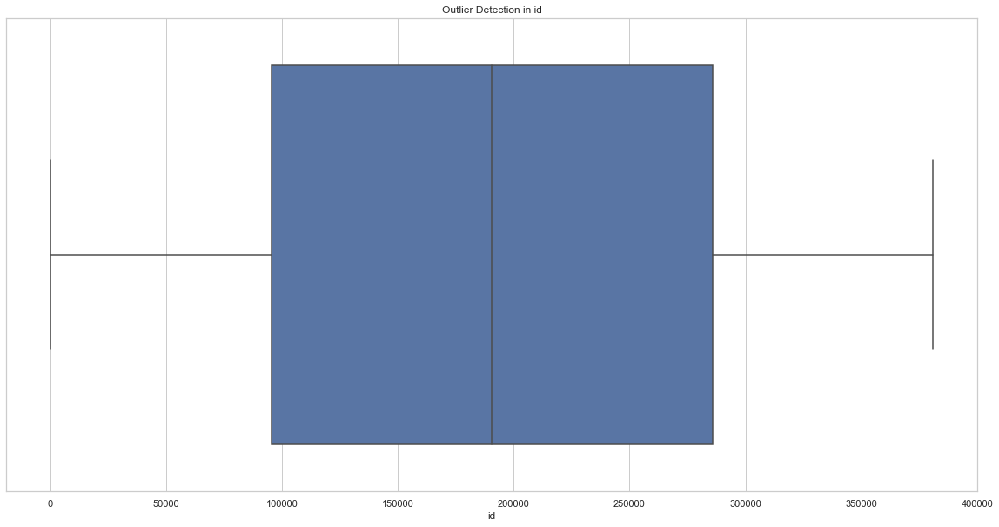

/Users/dambrielf67/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


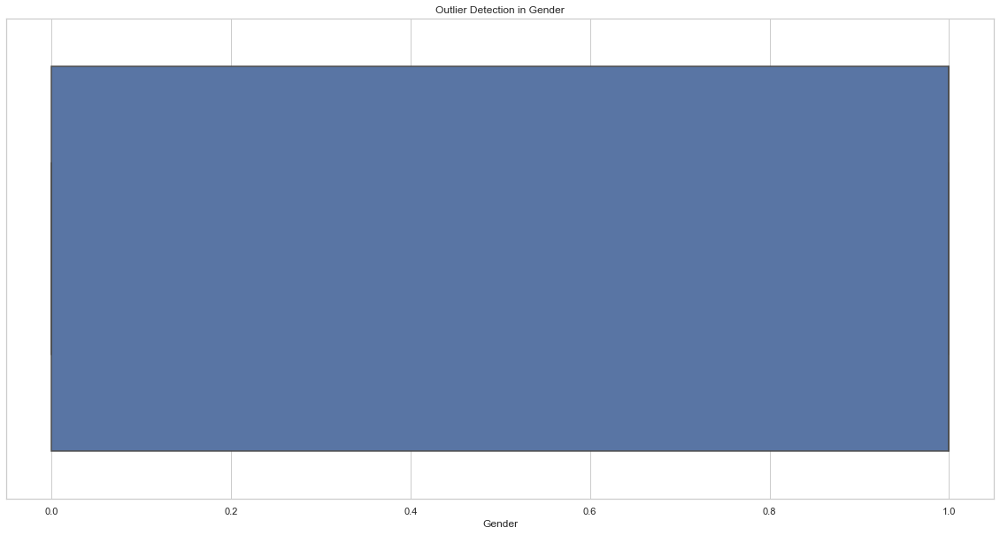

/Users/dambrielf67/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


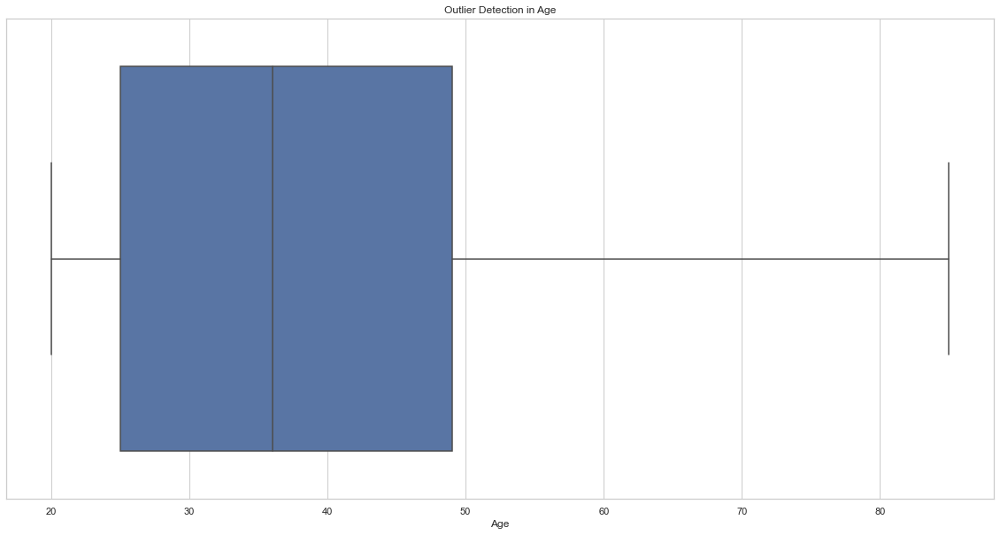

/Users/dambrielf67/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


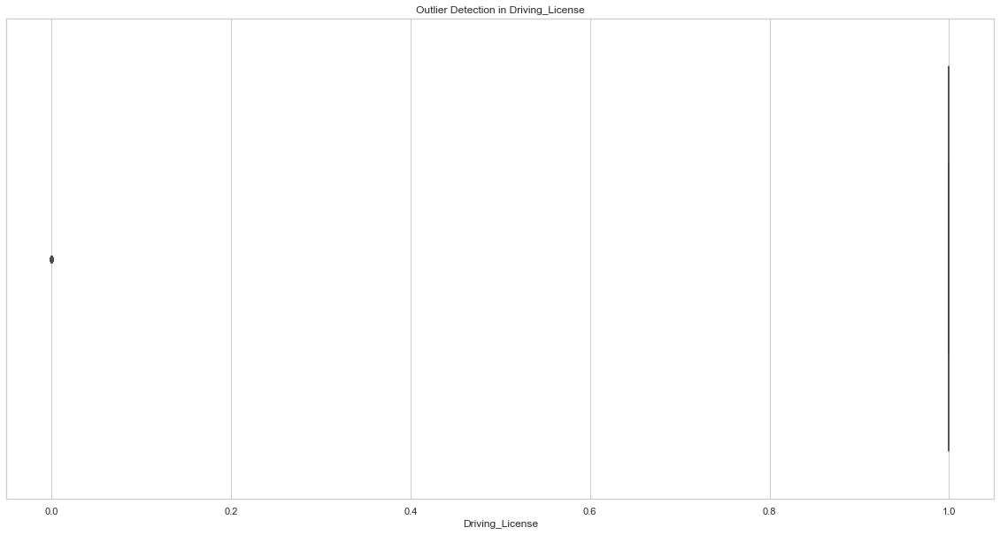

/Users/dambrielf67/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


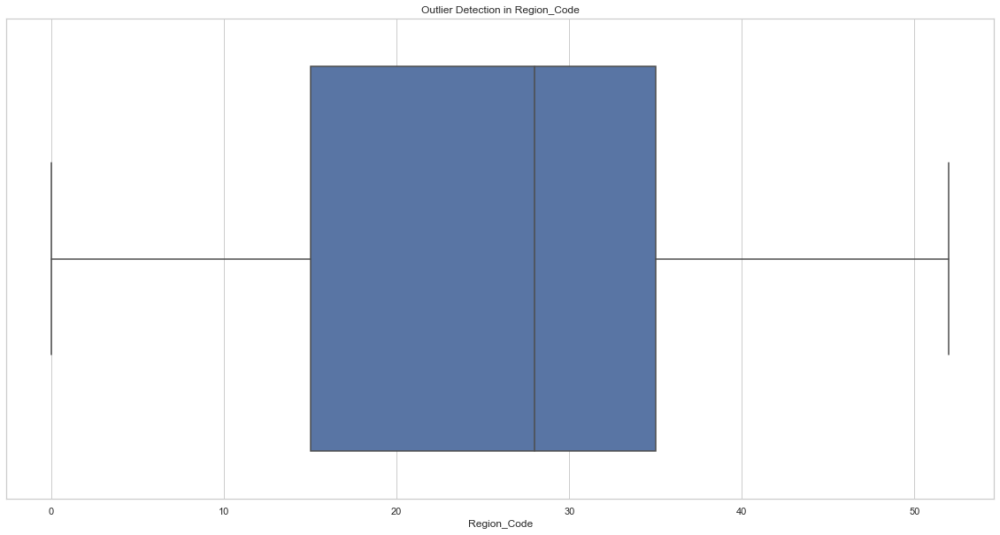

/Users/dambrielf67/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


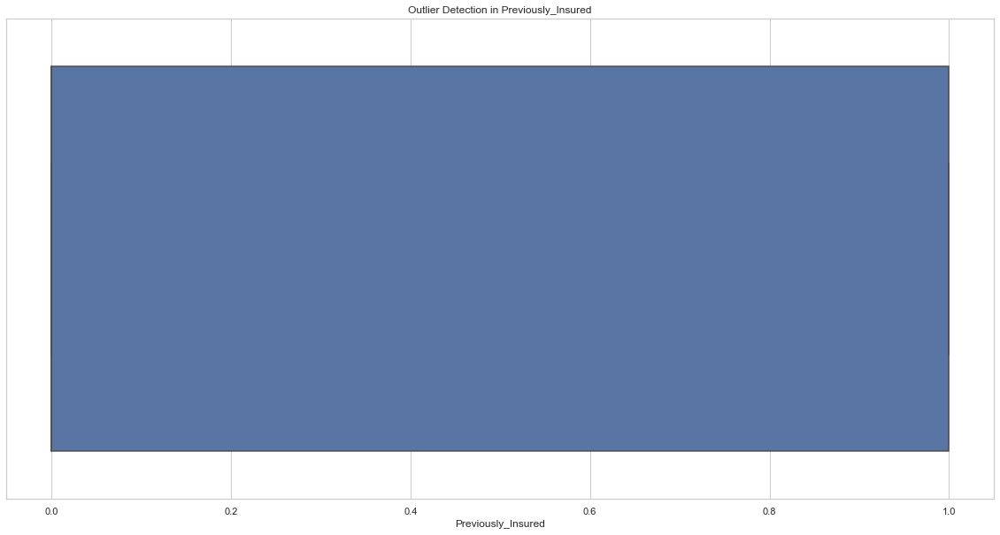

/Users/dambrielf67/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


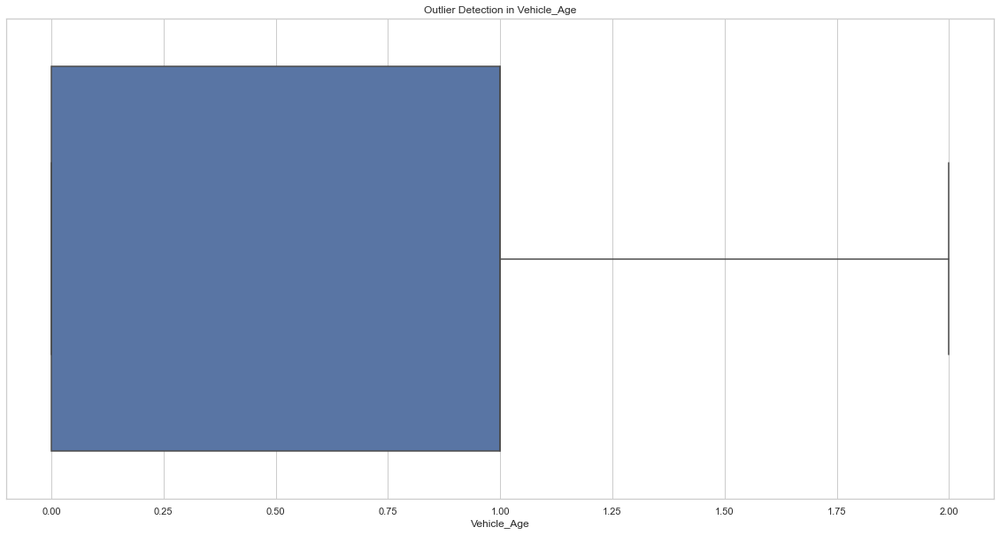

/Users/dambrielf67/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


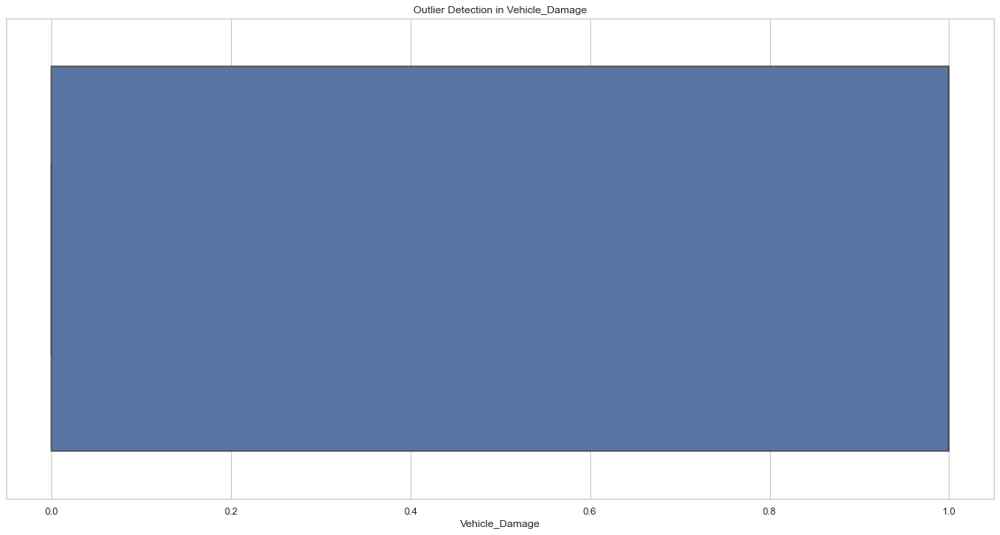

/Users/dambrielf67/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


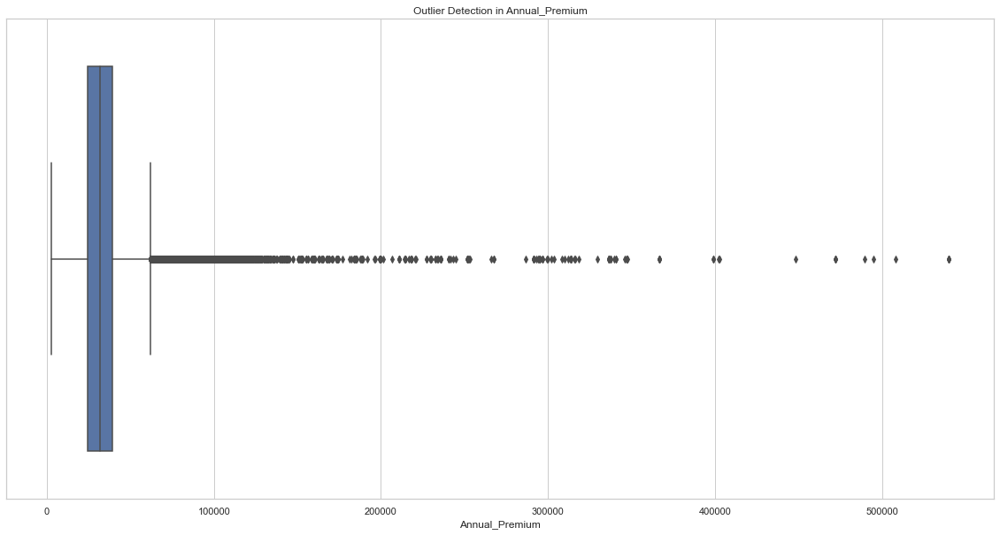

/Users/dambrielf67/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


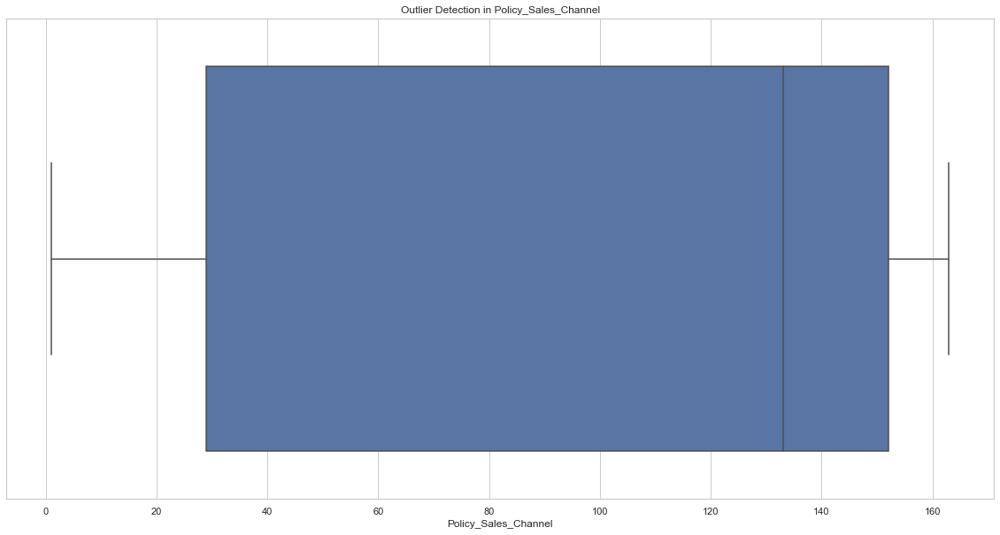

/Users/dambrielf67/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


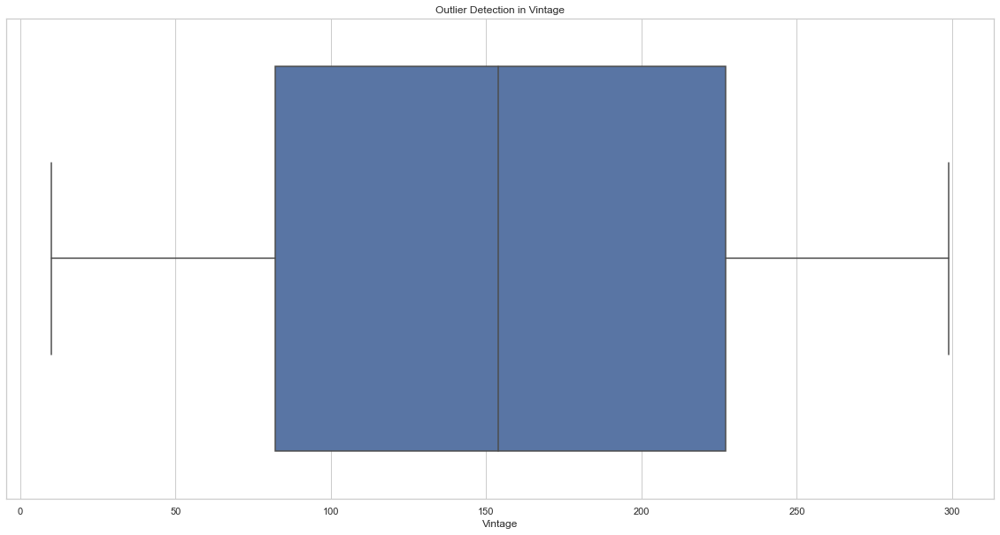

/Users/dambrielf67/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


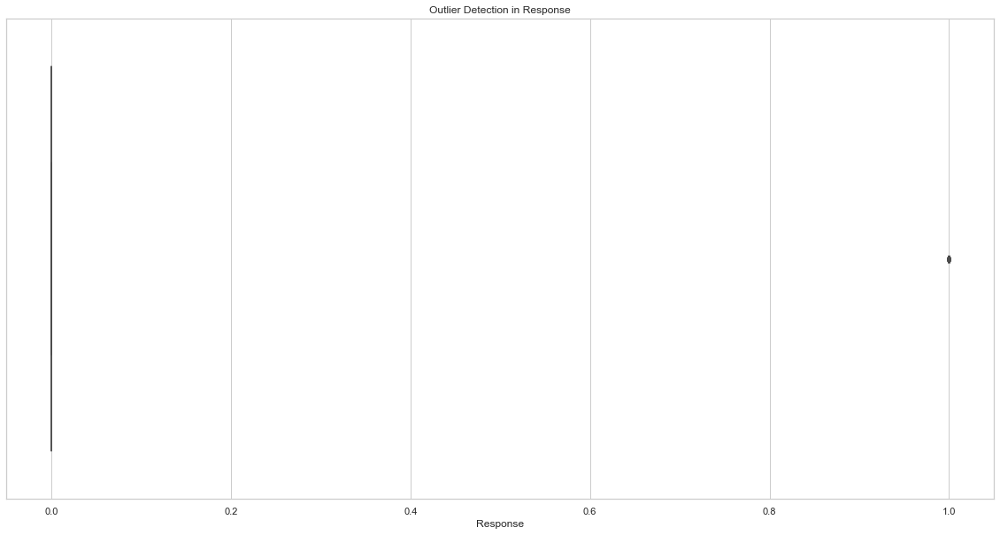

In [26]:
for i in insurance_data_train.columns:
    sns.boxplot(insurance_data_train[i])
    plt.title(f"Outlier Detection in {i}")
    plt.show()

Everthing except Annual_Premium looks good. So, there we have some outliers! To be sure, let us try using a scatter plot.

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


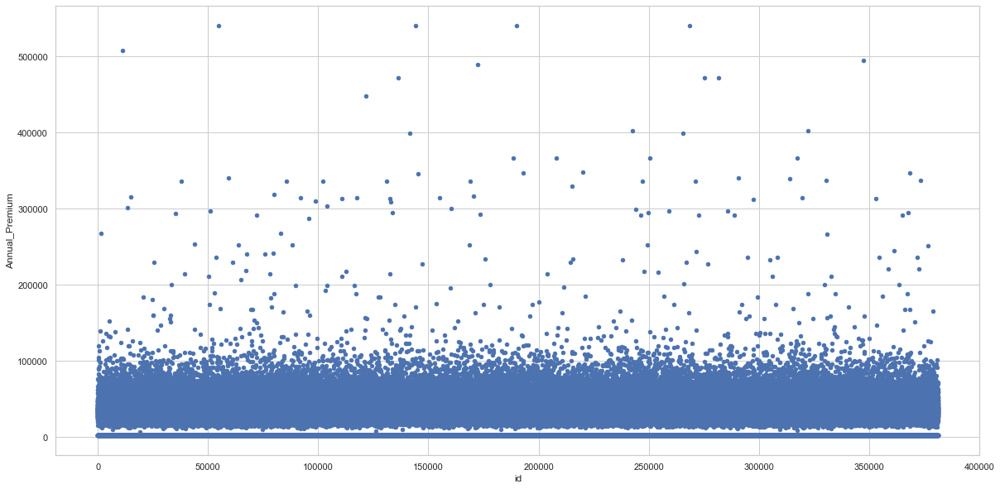

In [27]:
insurance_data_train.plot(x='id', y='Annual_Premium', kind='scatter');

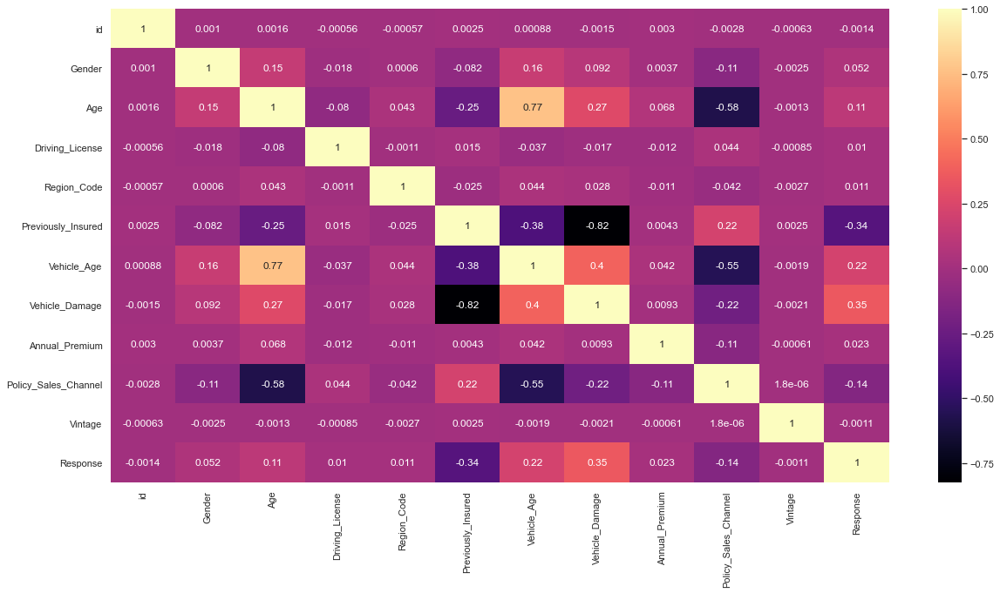

In [28]:
sb.heatmap(insurance_data_train.corr(), annot = True, cmap = 'magma')

plt.savefig('heatmap.png')
plt.show()

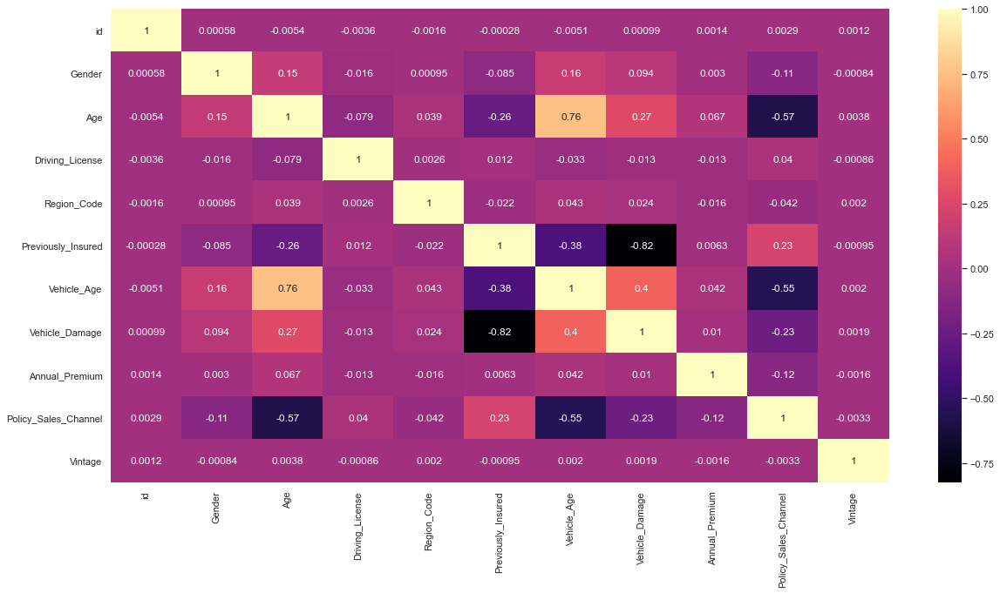

In [29]:
sb.heatmap(insurance_data_test.corr(), annot = True, cmap = 'magma')

plt.savefig('heatmap.png')
plt.show()

<AxesSubplot:>

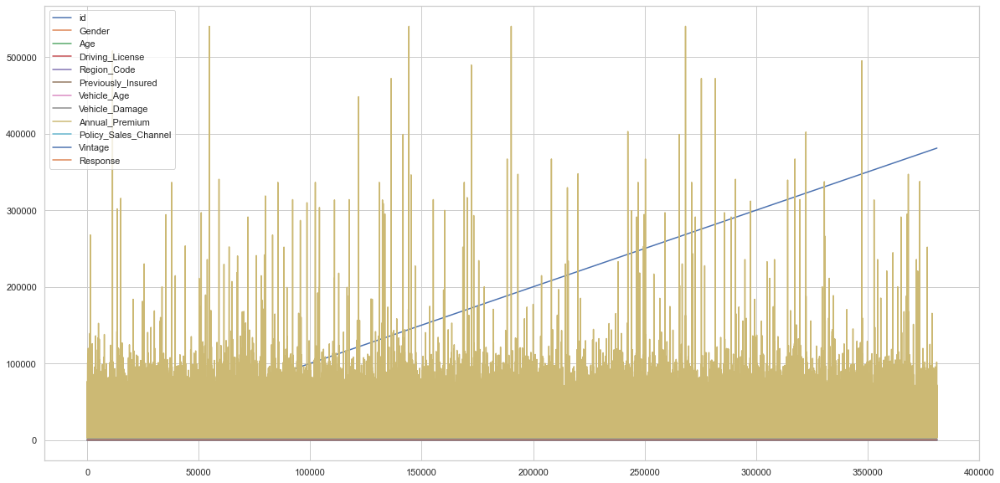

In [30]:
insurance_data_train.plot()

In [31]:
insurance_data_train['Gender'].value_counts()

1    206089
0    175020
Name: Gender, dtype: int64

In [32]:
insurance_data_train.Gender.value_counts(1)*100

1    54.07613
0    45.92387
Name: Gender, dtype: float64

54% of the customers are male and almost 46% are female.

###### Checking the proportion of classes in the target features

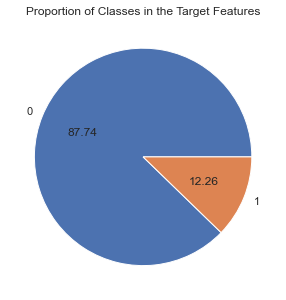

In [33]:
plt.figure(figsize = (5,5))
proportions = insurance_data_train.Response.value_counts(1)*100
labels = insurance_data_train.Response.value_counts(1).index
plt.pie(proportions,labels=labels,autopct="%.2f")
plt.title("Proportion of Classes in the Target Features")
plt.show()

Text(0.5, 1.0, 'Gender count')

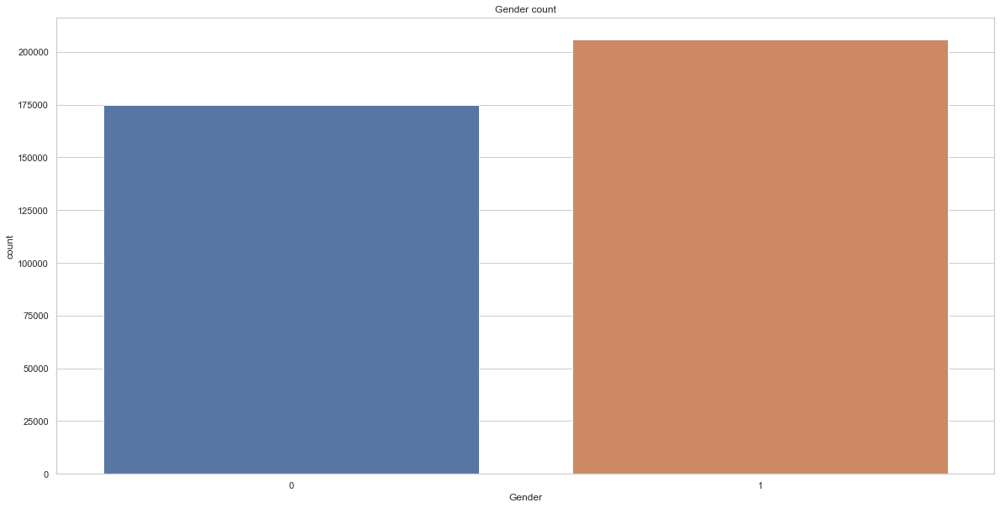

In [34]:
sns.countplot(data=insurance_data_train, x='Gender')
plt.title('Gender count')

There are almost as many males as females among our customers.

Text(0.5, 1.0, 'Previously Insured')

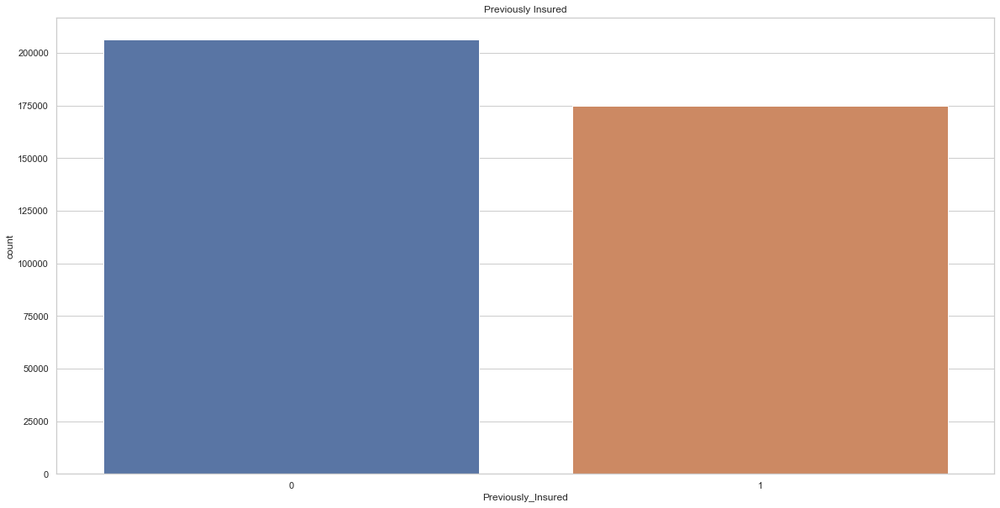

In [35]:
sns.countplot(data=insurance_data_train, x='Previously_Insured')
plt.title('Previously Insured')

In [36]:
insurance_data_train['Previously_Insured'].value_counts()

0    206481
1    174628
Name: Previously_Insured, dtype: int64

There are more uninsured people among the customers than the insured ones. These could be considered potential customers. Now, what is the proportion of previously insured males to previously insured females with respect to age and vehicle age?

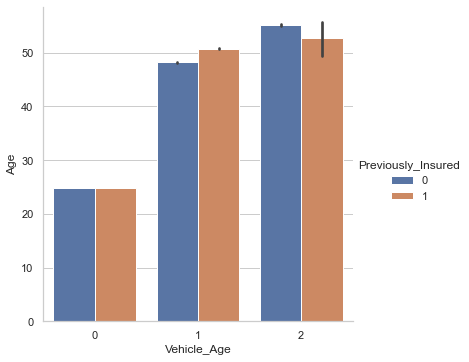

In [37]:
sns.catplot(y="Age",x="Vehicle_Age",kind="bar",hue="Previously_Insured",data=insurance_data_train)

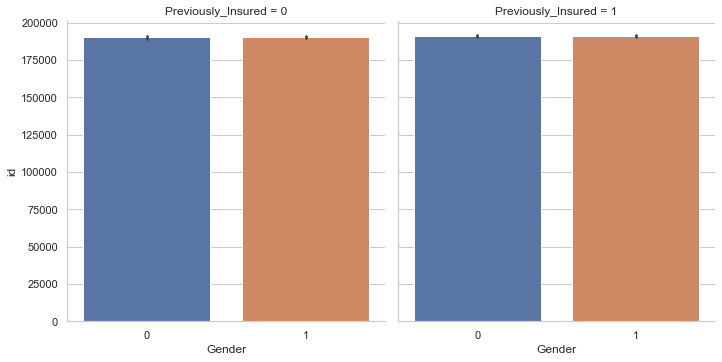

In [38]:
sns.catplot(x="Gender",y="id",col="Previously_Insured",kind="bar",data=insurance_data_train)

Proportions of insured and uninsured males to females are almost the same. Vehicle age is next. Rememeber that 0 = < 1 Year, 1 = 1-2 Years and 2 = > 2 Years for Vehicle_Age.

/Users/dambrielf67/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


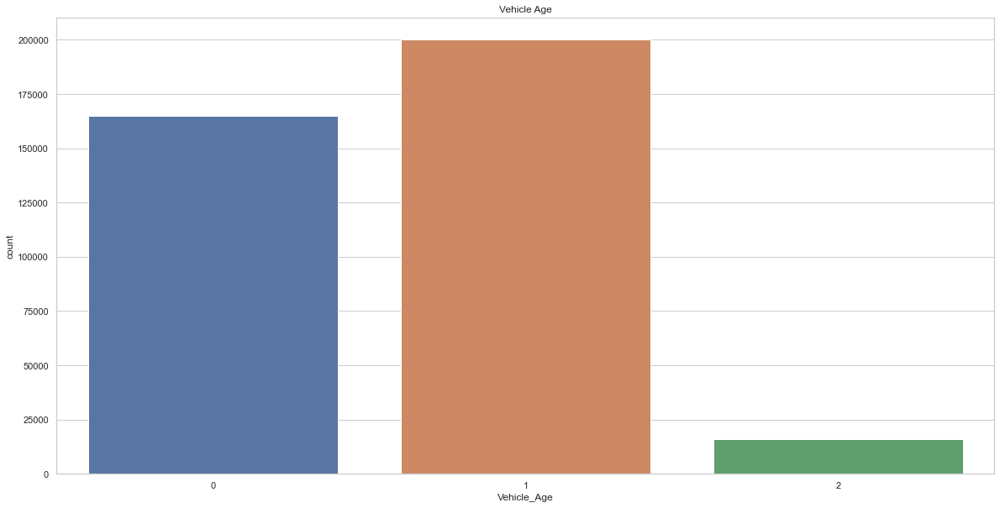

In [39]:
sns.countplot(insurance_data_train.Vehicle_Age)
plt.title("Vehicle Age")
plt.show()

 Majority of the customers use vehicles that are aged between 1 and 2 years. Could there be a reason for this? 

<AxesSubplot:xlabel='Vehicle_Age', ylabel='count'>

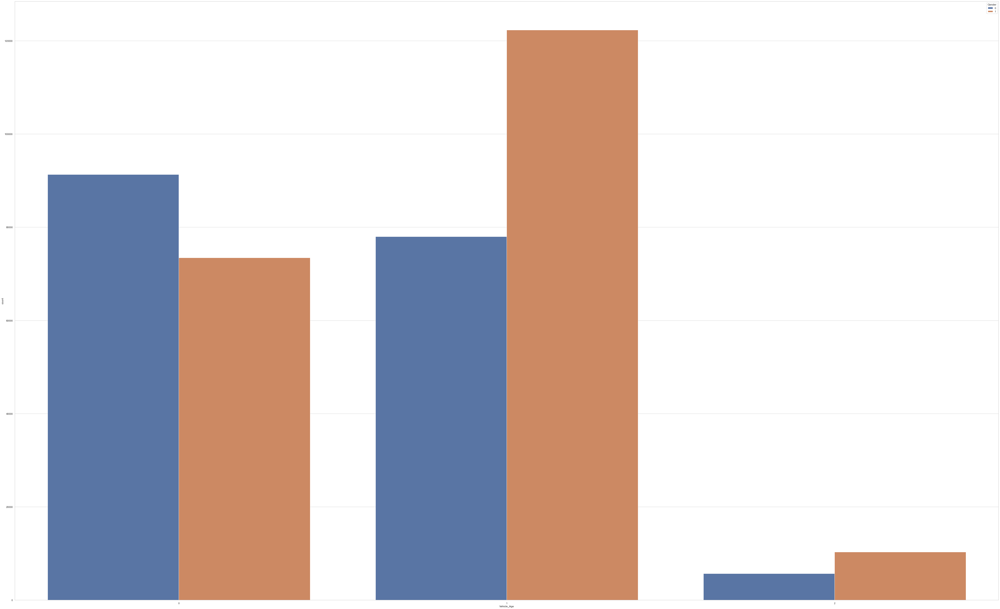

In [40]:
fig_dims = (80,50)
fig, ax = plt.subplots(figsize=fig_dims)
sns.countplot(x="Vehicle_Age",hue="Gender",data=insurance_data_train)

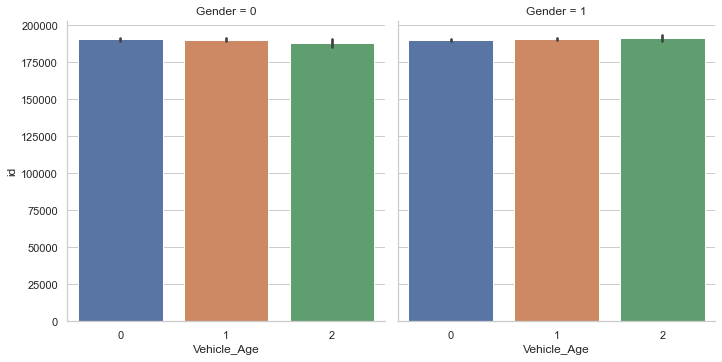

In [41]:
sns.catplot(y="id",x="Vehicle_Age",kind="bar",col="Gender",data=insurance_data_train)

The first diagram shows that most of the customers who own vehicles that are less than a year old are females and males are top in the other two categories, probably because there are slightly more males than females among the customers. But the second diagram shows that both gender follows almost the same pattern in buying vehicles with respect to vehicle age. Now, what is the proportion of customers who have driver's licence to those who do not have?

Text(0.5, 1.0, 'Drivers License')

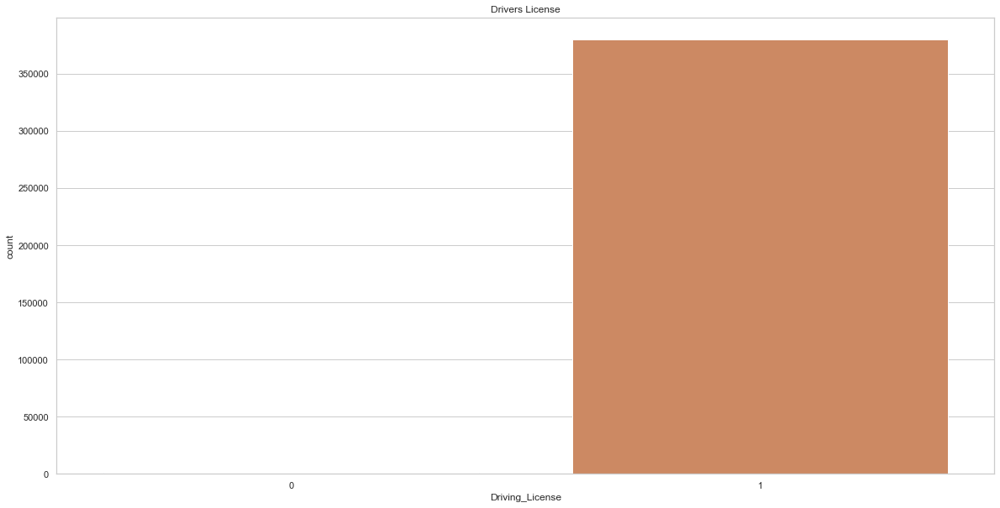

In [42]:
sns.countplot(data=insurance_data_train, x='Driving_License')
plt.title('Drivers License')

In [43]:
insurance_data_train.Driving_License.value_counts(1)*100

1    99.786938
0     0.213062
Name: Driving_License, dtype: float64

Almost all, except less than 1%, of customers have driver's licence. Now let's see the proportion of customers who have had their vehicles damaged at some point to those who have not.

Text(0.5, 1.0, 'Vehicle Damage')

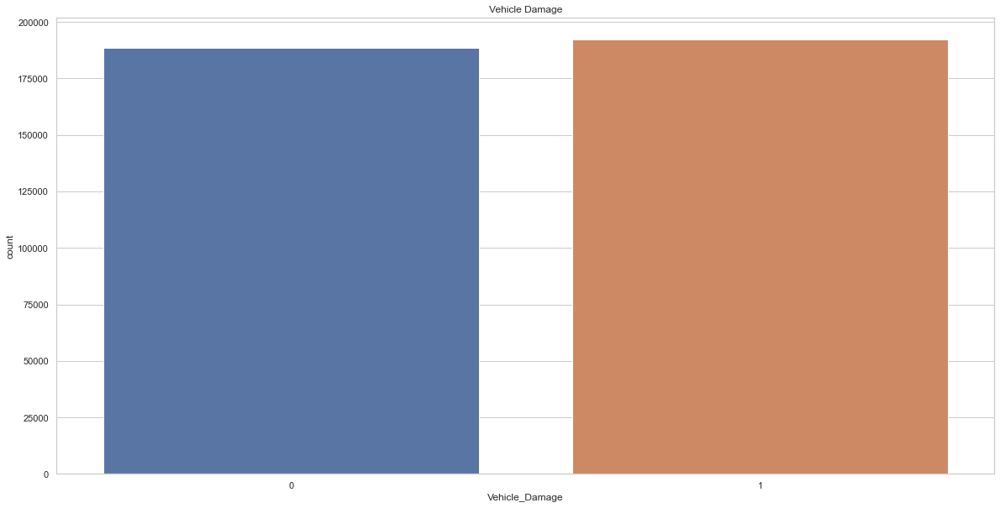

In [44]:
sns.countplot(data=insurance_data_train, x='Vehicle_Damage')
plt.title('Vehicle Damage')

There are almost as many customers who have had their vehicles damaged as those who have not. Now let us separate those who have damaged their vehicles and those who have not into male and female categories.

<AxesSubplot:xlabel='Vehicle_Damage', ylabel='count'>

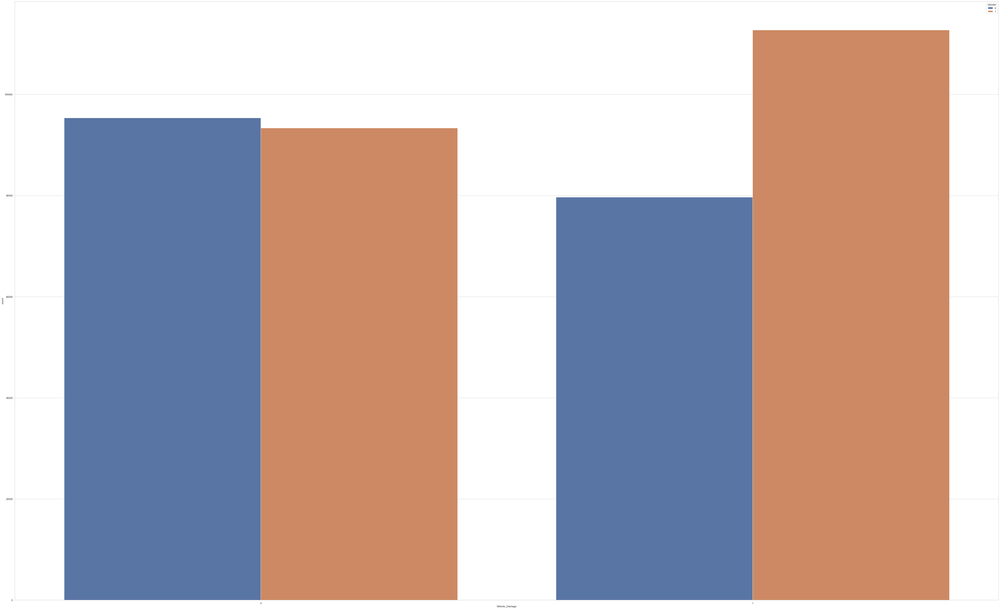

In [45]:
fig_dims = (80,50)
fig, ax = plt.subplots(figsize=fig_dims)
sns.countplot(x="Vehicle_Damage",hue="Gender",data=insurance_data_train)

Oh! More males have damaged their vehicles than females. Are females more careful than males? LOL!!!!!!!!!!!!!!!!! 

In [46]:
# TO-CHECK later: What age groups have damaged the most cars?

In [47]:
fig = px.histogram(insurance_data_train, x='Policy_Sales_Channel')
fig.update_layout(height=500, width=500,
                  title_text="Policy_Sales_Channel distribution")
fig.show()

<AxesSubplot:xlabel='Region_Code', ylabel='count'>

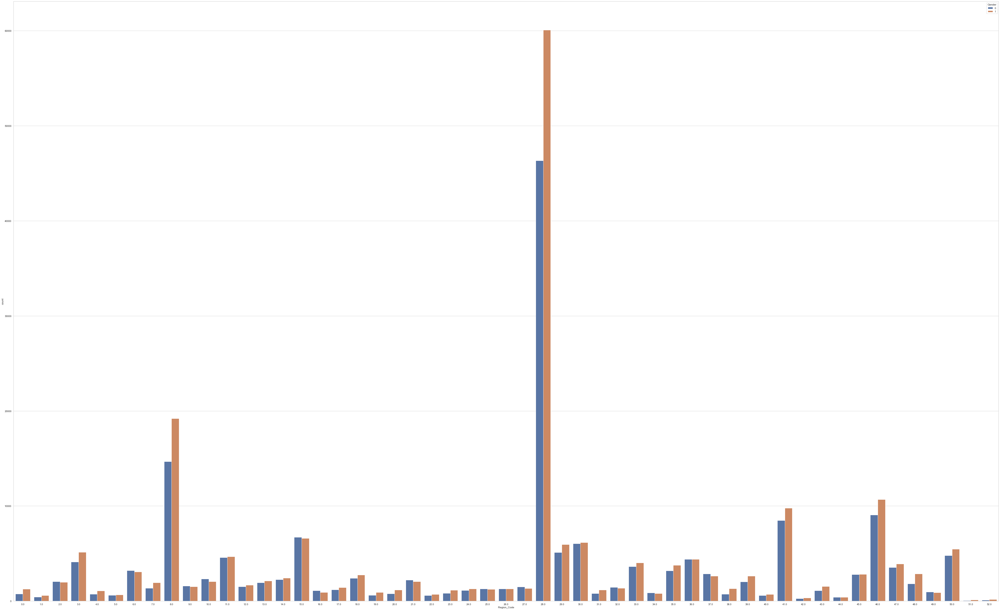

In [48]:
fig_dims = (80,50)
fig, ax = plt.subplots(figsize=fig_dims)
sns.countplot(x="Region_Code",hue="Gender",data=insurance_data_train)

For most region code areas, the numbers of male customers are pretty close to those of females.

<AxesSubplot:xlabel='Age', ylabel='count'>

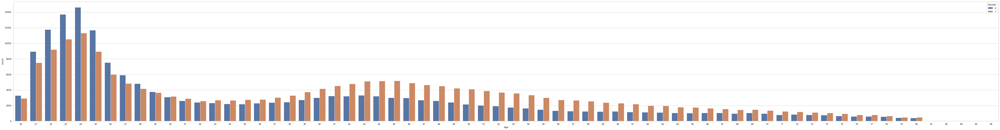

In [49]:
fig_dims = (80,10)
fig, ax = plt.subplots(figsize=fig_dims)
sns.countplot(x="Age",hue="Gender",data=insurance_data_train)

The above shows that more females tend to own vehicles at a younger age than males. But, this changes as the ages increase, that is, more older males own vehicles than older females. 

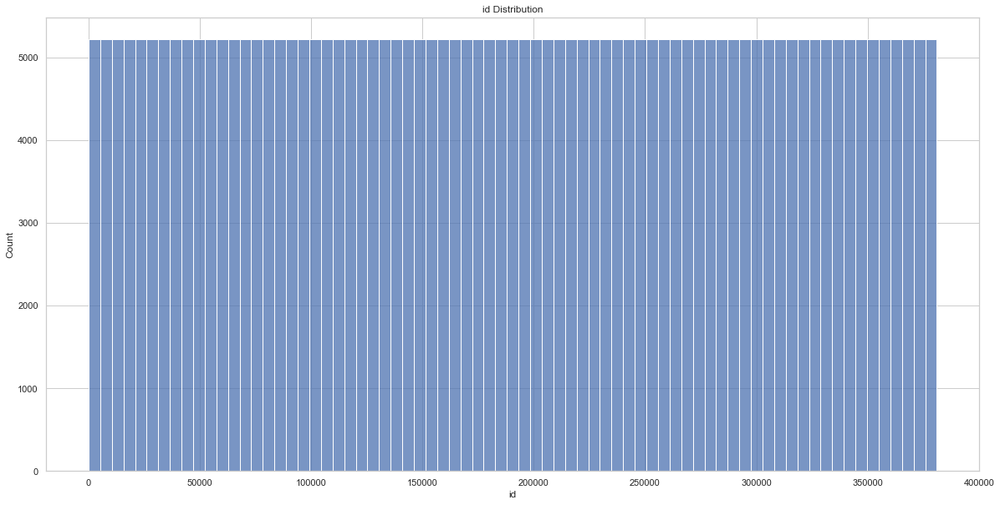

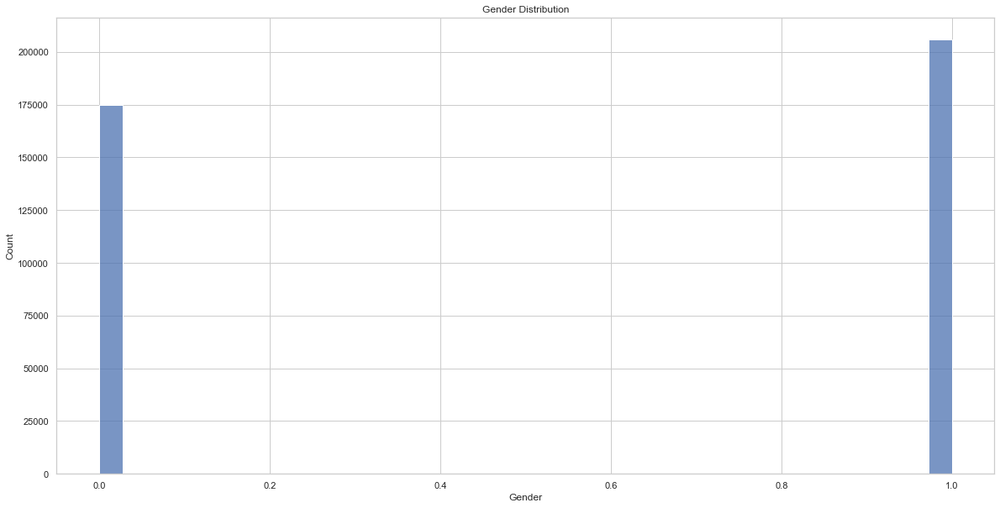

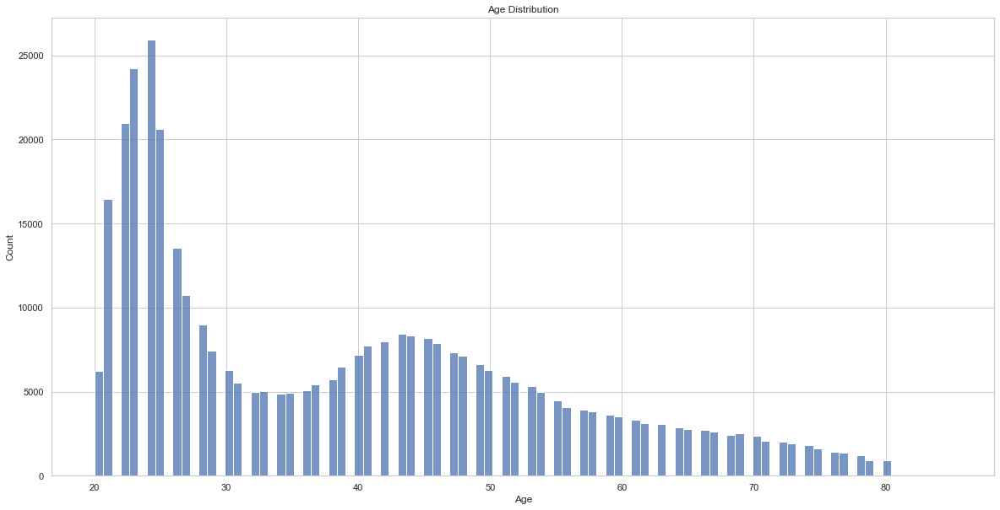

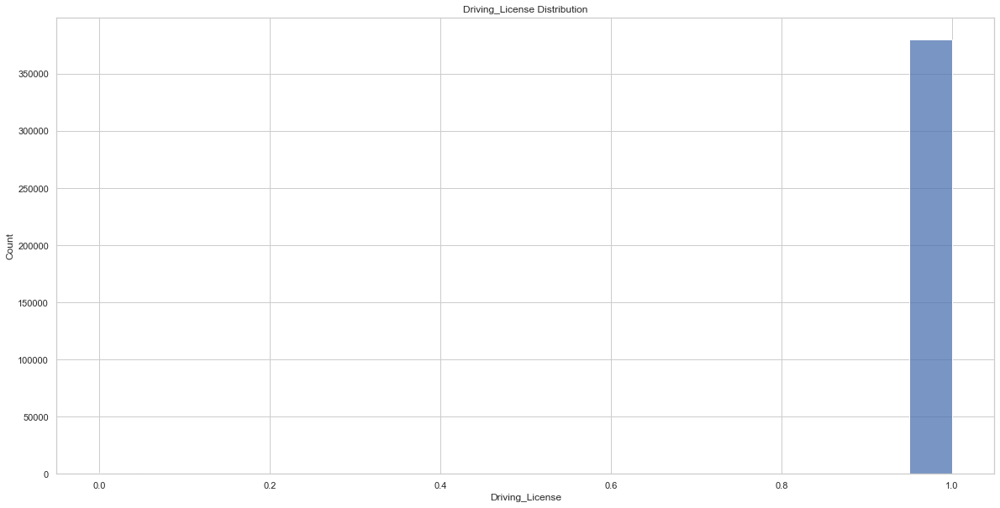

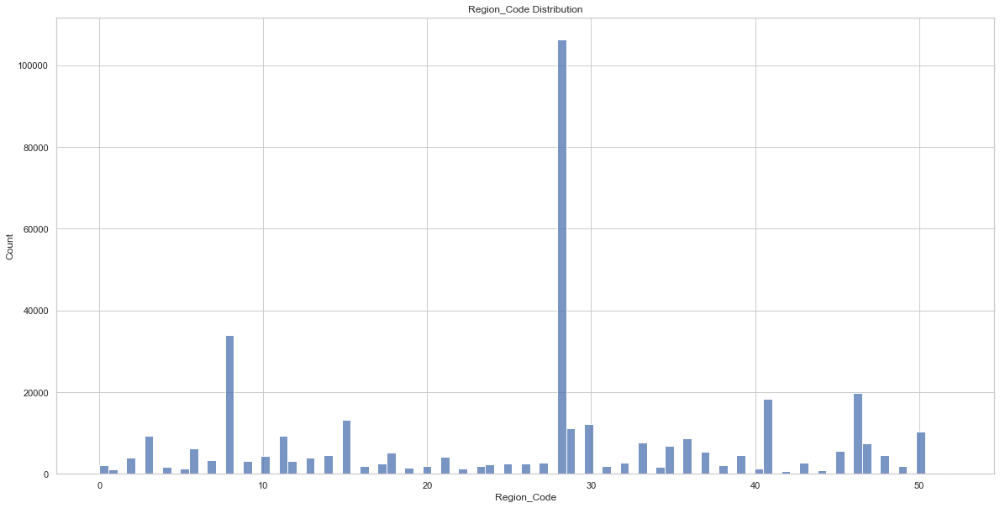

...

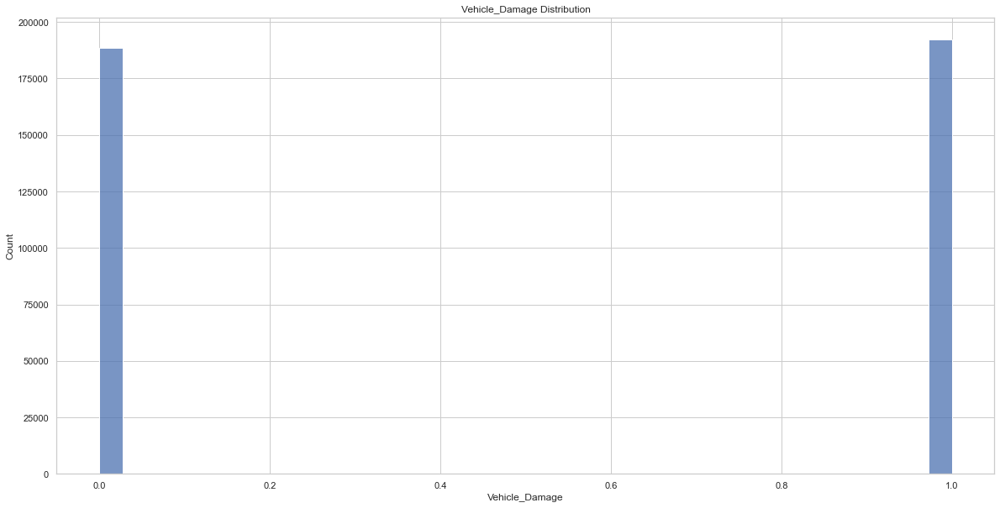

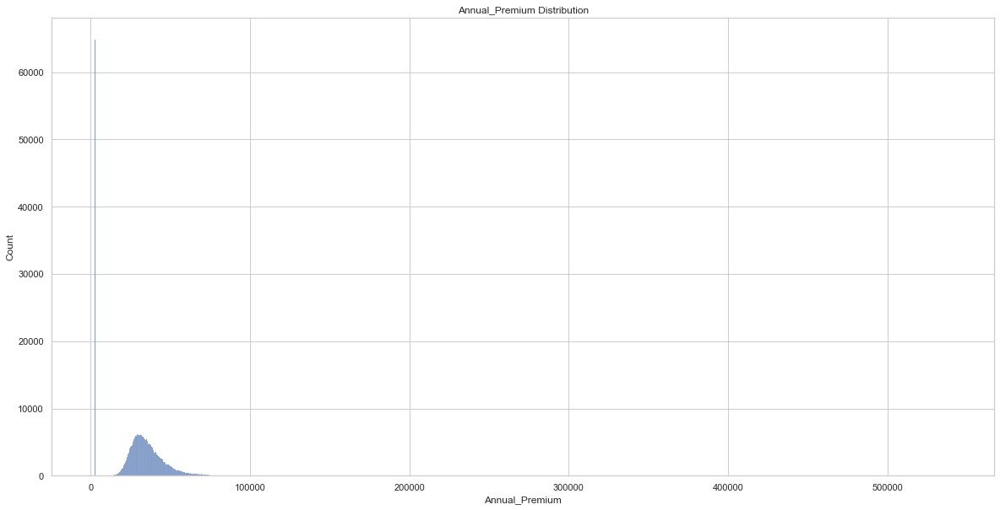

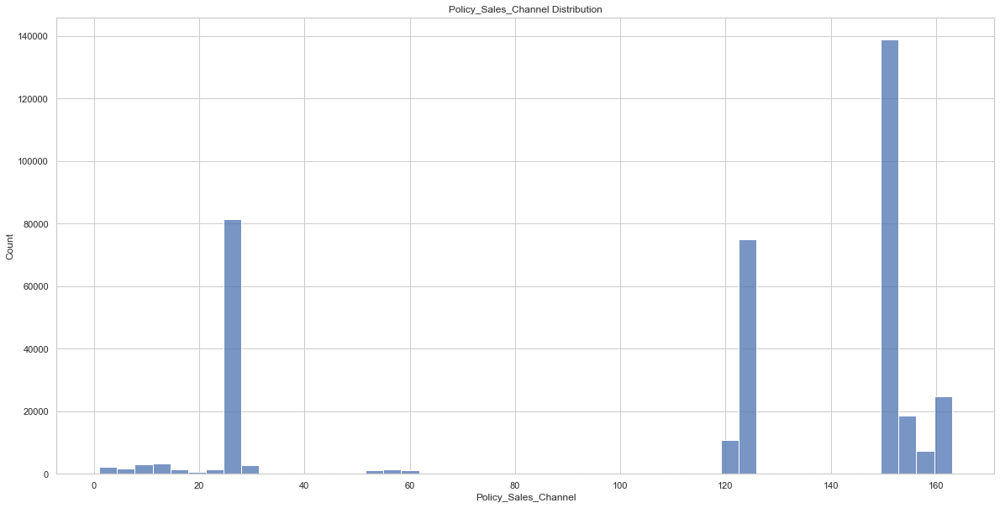

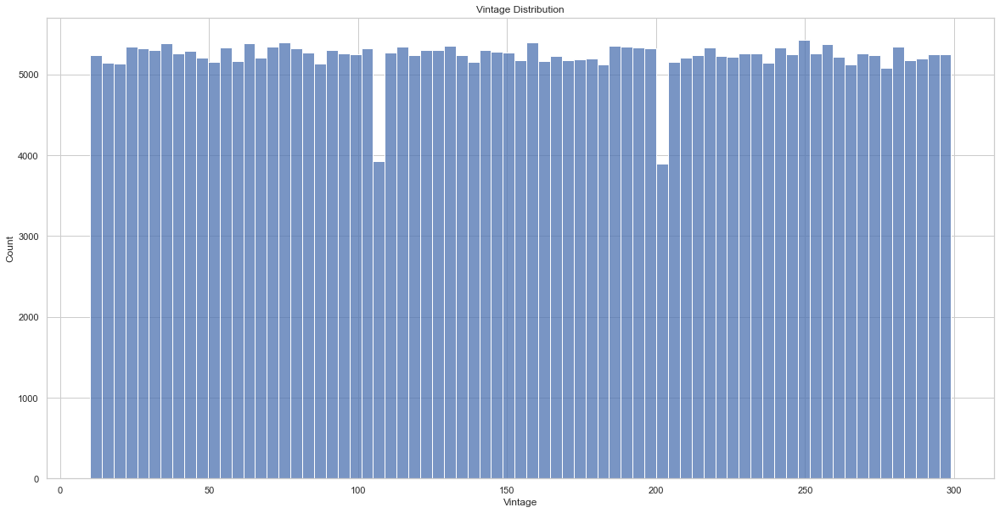

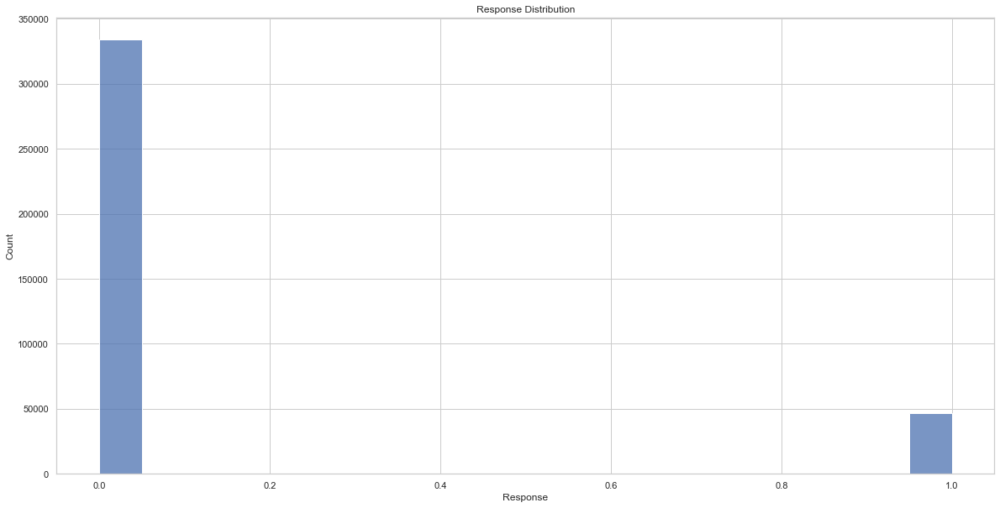

In [50]:
for i in insurance_data_train.columns:
    sns.histplot(insurance_data_train[i])
    plt.title(f"{i} Distribution")
    plt.show()

Most customers are aged between 20 and 30. Almost everyone has a driver's licence. Number of days they've been with the company (Vintage) is uniformly distributed. Areas with region codes 28 and 8 have the highest and second highest represented customers respectively. It could mean these are high income areas and people there can afford to pay for insurance. Most of the customers got their insurance with the company through sales channels somewhere between 20-30, 120-130 and 150-160 (26, 124 and 152). Could these channels be more appealing to the customers, especially young people, since they make up most of the customers? Next let us consider who will most likely be our targeted customers based on certain information.

###### Summary of all Distributions

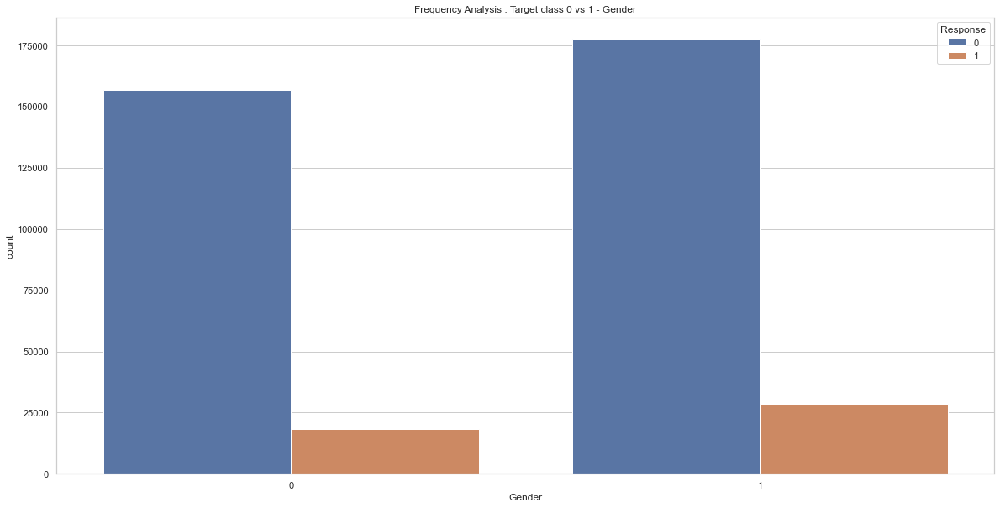

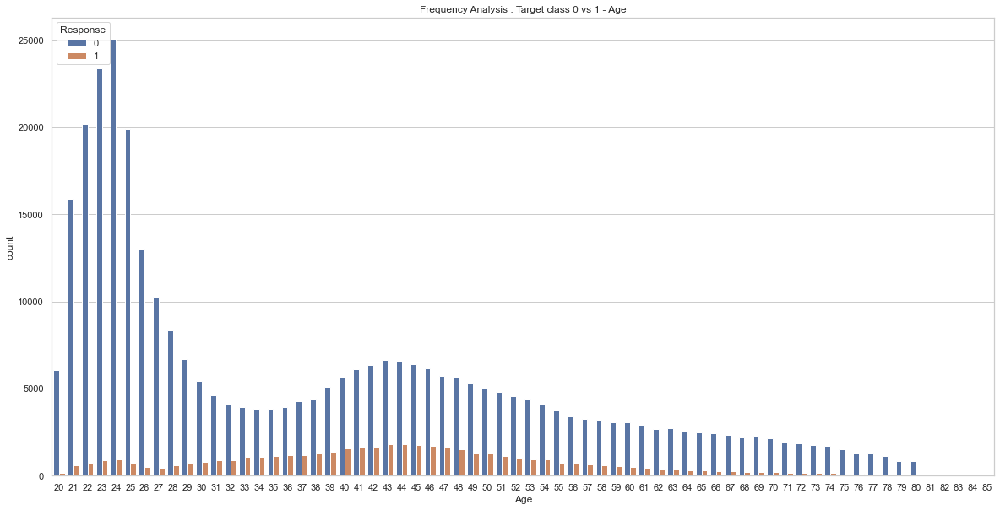

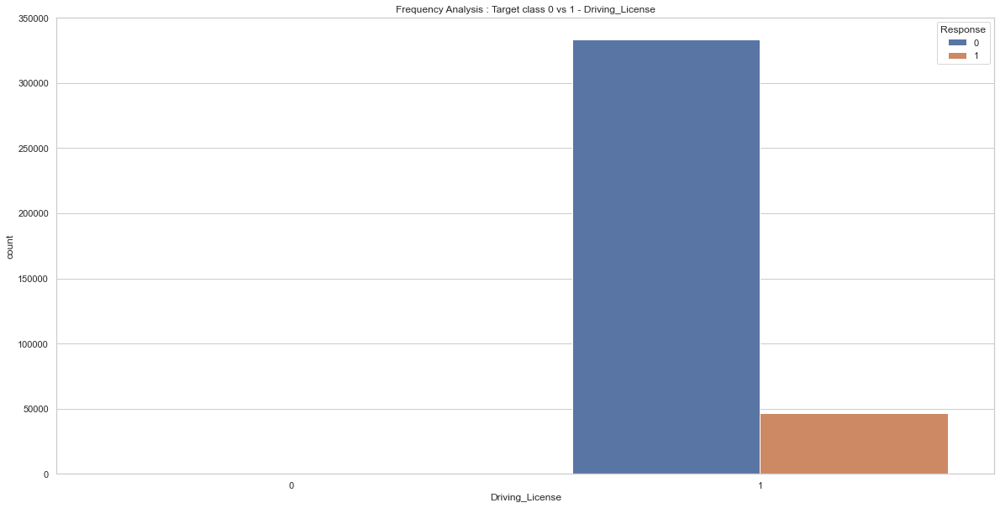

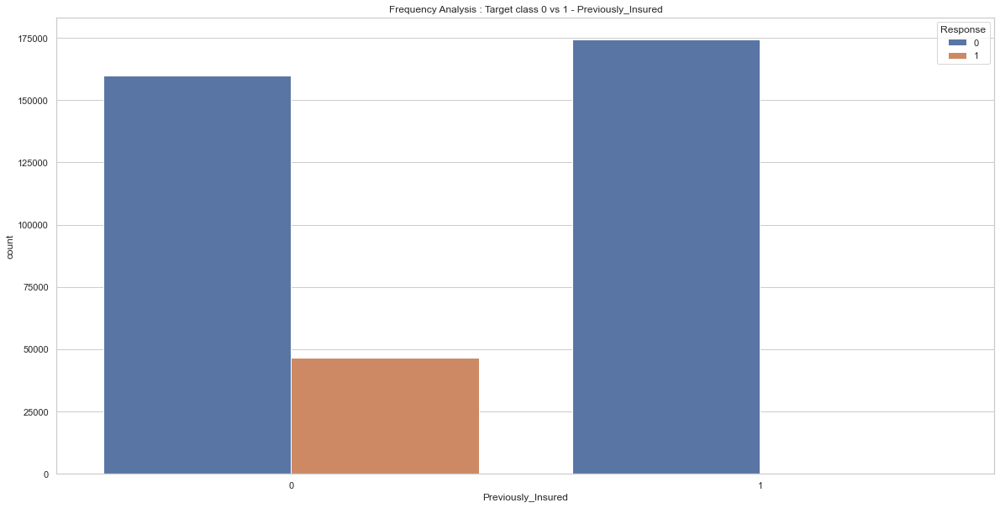

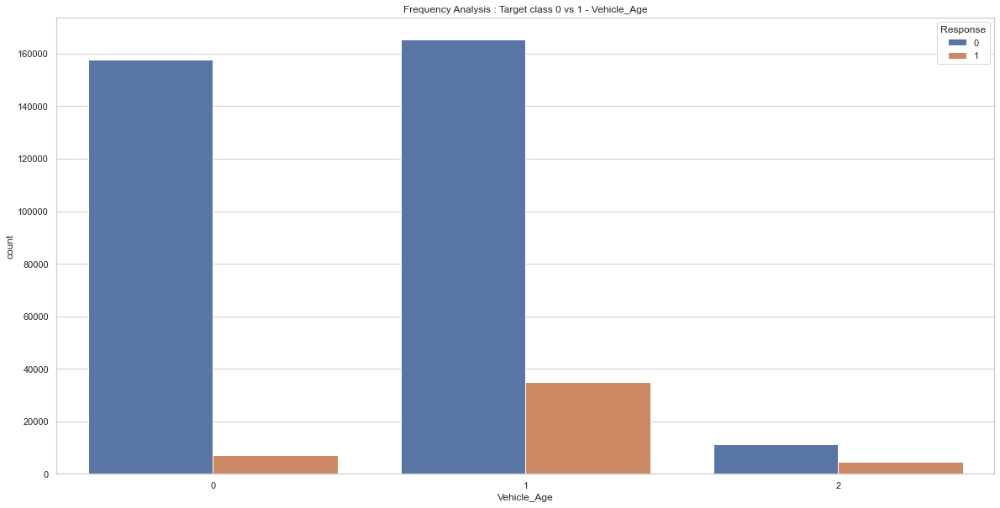

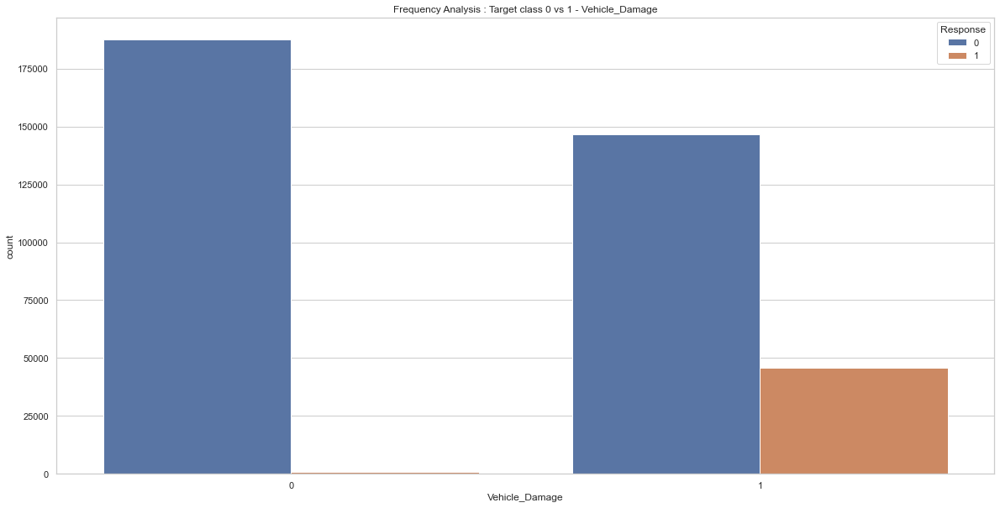

In [51]:
for col in insurance_data_train.drop(["id", "Region_Code", "Annual_Premium", "Policy_Sales_Channel", "Vintage", "Response"],axis=1).columns:
    sns.countplot(x=insurance_data_train[col],hue=insurance_data_train.Response)
    plt.title(f"Frequency Analysis : Target class 0 vs 1 - {col}")
    plt.show()

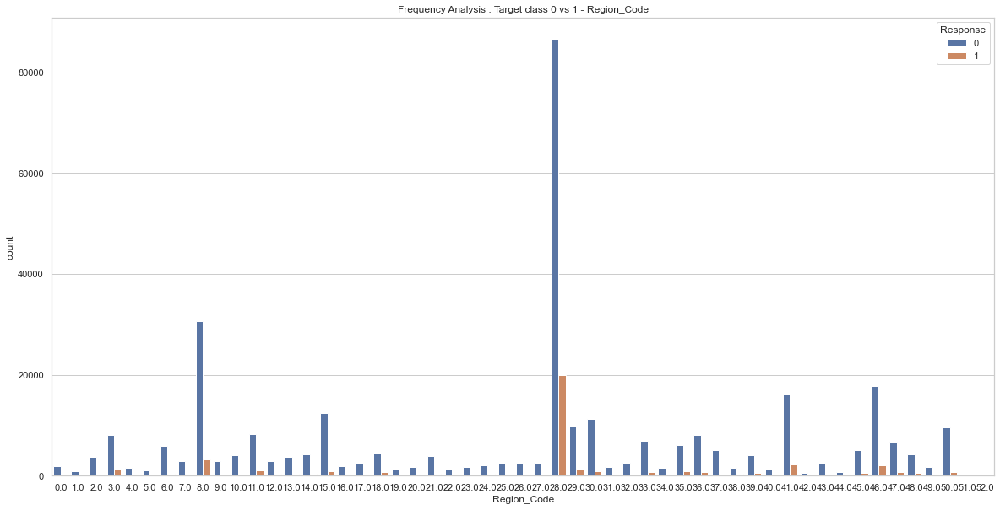

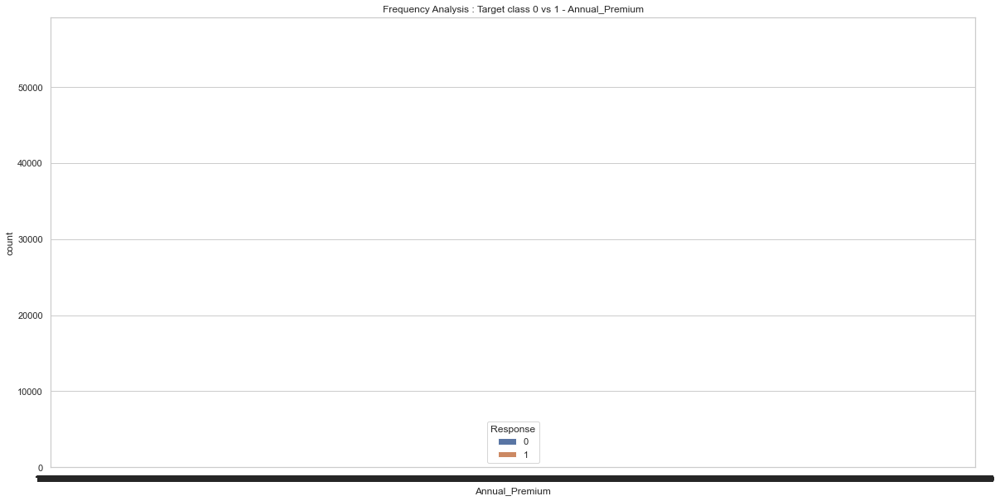

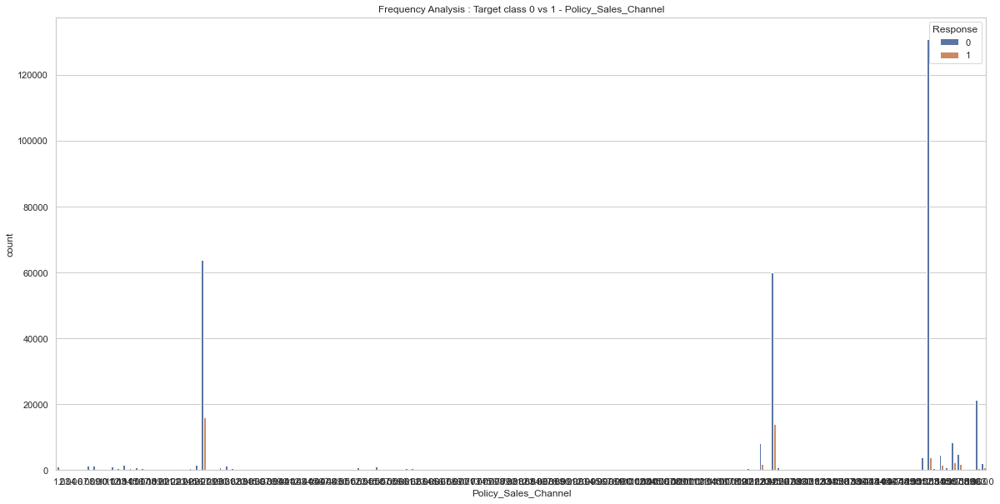

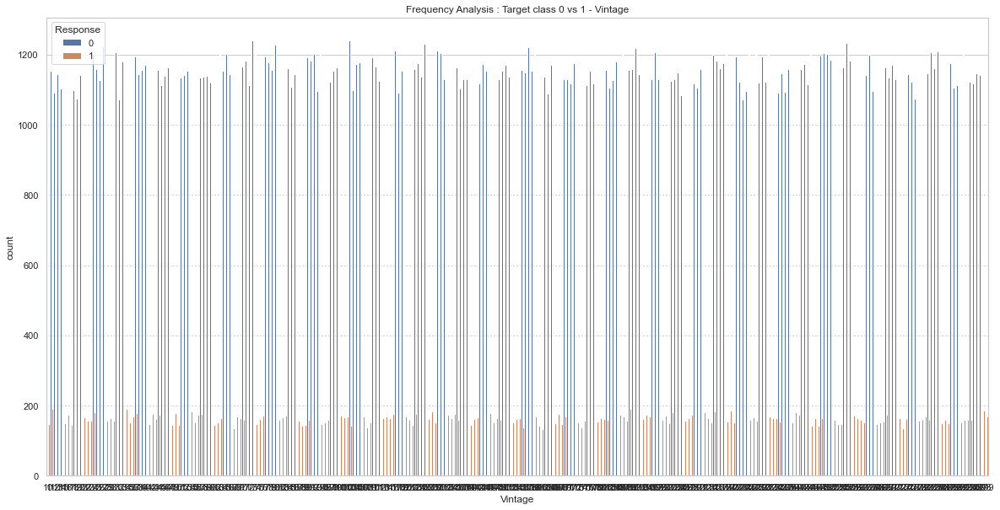

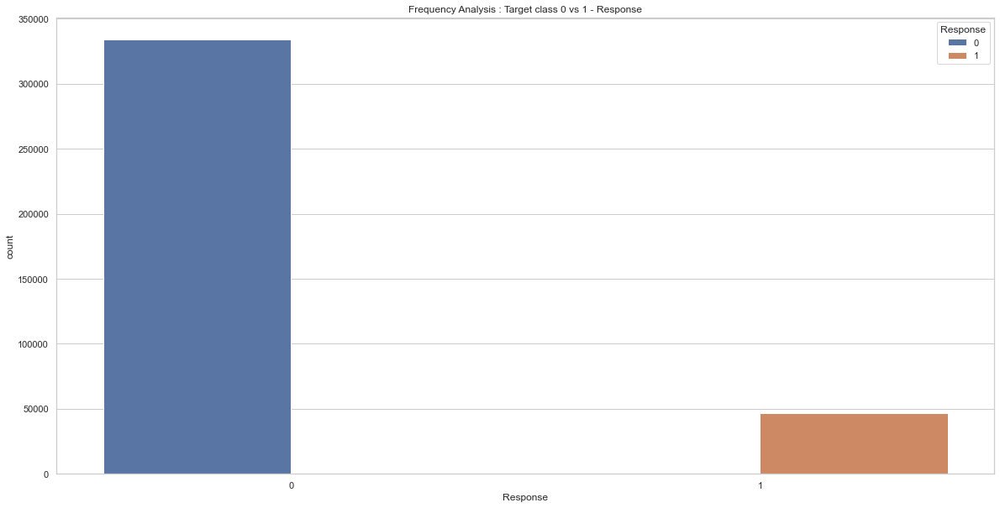

In [52]:
for col in insurance_data_train.drop(["id", "Gender", "Age", "Driving_License", "Previously_Insured", "Vehicle_Age", "Vehicle_Damage"],axis=1).columns:
    sns.countplot(x=insurance_data_train[col],hue=insurance_data_train.Response)
    plt.title(f"Frequency Analysis : Target class 0 vs 1 - {col}")
    plt.show()

###### EDA Findings

From the above, more males gave a positive response than females. Customers aged between mid-thirties and mid-fifties also gave a positive response. Customers who have driver's license are most likely to give a positive response (customers who do not have driver's license are not many anyway). Previously insured customers all gave a negative response, so those without vehicle insurance are a better target. Customers with vehicles aged between one and two years gave more positive responses than those in the other categories. Majority of customers who have not damaged their vehicles said they are not interested in our vehicle insurance, which might want to make us shift our attention to those who have damaged their vehicles. Customers who got their insurance through channels 152, 26 and 124, especially those from region 28, are most interested in our auto insurance compared to those who got their insurance through other channels. How long a customer has been patronizing the company (Vintage) and annual premium he or she pays do not affect his or her response. Now to data profiling!

In [53]:
#Rates could be discounted for older customers with respect to age and vintage. Customers with newer vehicles should probably get some discounts too since, bar any accidents, the likelihood of their vehicles breaking down is pretty low.

In [54]:
!pip install pandas-profiling==2.8.0
import pandas_profiling as pp
insurance_data_train.profile_report()

# PRE-PROCESSING

###### Feature Selection and Data Split

In [55]:
X = insurance_data_train.drop(['Vintage', 'Annual_Premium', 'Driving_License', 'Response'],axis=1)
y = insurance_data_train['Response']

In [56]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 0)

In [57]:
print(X.shape)
print(y.shape)

(381109, 8)
(381109,)


In [58]:
print(X_train.shape)
print(X_test.shape)

(304887, 8)
(76222, 8)


In [59]:
results = pd.DataFrame({"Model":None,"Train F1":None,"Test F1":None,"Cross Validation Mean F1":None,"Cross Validation std in scores":None},index=range(0,8))

# MODELING

### Logistic Regression

In [60]:
lr = LogisticRegression().fit(X_train.drop("Age", axis=1),y_train)
train_lr_f1 = f1_score(y_train, lr.predict(X_train.drop("Age",axis=1)))
test_lr_f1 = f1_score(y_test, lr.predict(X_test.drop("Age",axis=1)))
print("Training f1:", train_lr_f1)
print("Testing f1:", test_lr_f1)
print()
print("Model Performance Report")
print("Training Performance:", classification_report(y_train, lr.predict(X_train.drop("Age",axis=1))),sep="\n")
print()
print("Test Performance:", classification_report(y_test, lr.predict(X_test.drop("Age",axis=1))),sep="\n")

lr_cv = cross_val_score(LogisticRegression(), X_train, y_train, cv=3, scoring="f1")
print("Mean of f1 scores:", lr_cv.mean())
print("Deviation in f1 scores:", lr_cv.std())
results.iloc[0,0] = "Logistic Regression"
results.iloc[0,1] = train_lr_f1
results.iloc[0,2] = test_lr_f1
results.iloc[0,3] = lr_cv.mean()
results.iloc[0,4] = lr_cv.std()


Training f1: 0.0
Testing f1: 0.0

Model Performance Report


/Users/dambrielf67/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/Users/dambrielf67/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



Training Performance:
              precision    recall  f1-score   support

           0       0.88      1.00      0.93    267553
           1       0.00      0.00      0.00     37334

    accuracy                           0.88    304887
   macro avg       0.44      0.50      0.47    304887
weighted avg       0.77      0.88      0.82    304887


Test Performance:
              precision    recall  f1-score   support

           0       0.88      1.00      0.93     66846
           1       0.00      0.00      0.00      9376

    accuracy                           0.88     76222
   macro avg       0.44      0.50      0.47     76222
weighted avg       0.77      0.88      0.82     76222

Mean of f1 scores: 0.0
Deviation in f1 scores: 0.0


The Logistic Regression model has an F1 score of 0 on the test data and an average F1 score of 0, which is really poor.

### Naive Bayes (Gaussian)

In [61]:
nb = GaussianNB().fit(X_train, y_train)
train_nb_f1 = f1_score(y_train, nb.predict(X_train))
test_nb_f1 = f1_score(y_test, nb.predict(X_test))
print("Training f1:", train_nb_f1)
print("Testing f1:", test_nb_f1)
print()
print("Model Performance Report")
print("Training Performance:", classification_report(y_train, nb.predict(X_train)), sep="\n")
print()
print("Test Performance:", classification_report(y_test, nb.predict(X_test)), sep="\n")

nb_cv = cross_val_score(GaussianNB(), X_train, y_train, cv=3, scoring="f1")
print("Mean of f1 scores:", nb_cv.mean())
print("Deviation in f1 scores:", nb_cv.std())
results.iloc[0,0] = "Naive Bayes (Gaussian)"
results.iloc[0,1] = train_nb_f1
results.iloc[0,2] = test_nb_f1
results.iloc[0,3] = nb_cv.mean()
results.iloc[0,4] = nb_cv.std()


Training f1: 0.0
Testing f1: 0.0

Model Performance Report


/Users/dambrielf67/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/Users/dambrielf67/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



Training Performance:
              precision    recall  f1-score   support

           0       0.88      1.00      0.93    267553
           1       0.00      0.00      0.00     37334

    accuracy                           0.88    304887
   macro avg       0.44      0.50      0.47    304887
weighted avg       0.77      0.88      0.82    304887


Test Performance:
              precision    recall  f1-score   support

           0       0.88      1.00      0.93     66846
           1       0.00      0.00      0.00      9376

    accuracy                           0.88     76222
   macro avg       0.44      0.50      0.47     76222
weighted avg       0.77      0.88      0.82     76222

Mean of f1 scores: 0.0
Deviation in f1 scores: 0.0


Like the Logistic Regression model, the Naive Bayes (Gaussian) model has an F1 score of 0 on the test data and a mean F1 score of 0, which is also poor.

### Naive Bayes (Bernoulli)

In [62]:
nb_2 = BernoulliNB().fit(X_train, y_train)
train_nb_2_f1 = f1_score(y_train, nb_2.predict(X_train))
test_nb_2_f1 = f1_score(y_test, nb_2.predict(X_test))
print("Training f1:", train_nb_2_f1)
print("Testing f1:", test_nb_2_f1)
print()
print("Model Performance Report")
print("Training Performance:", classification_report(y_train, nb_2.predict(X_train)), sep="\n")
print()
print("Test Performance:", classification_report(y_test, nb_2.predict(X_test)), sep="\n")

nb_2_cv = cross_val_score(BernoulliNB(), X_train, y_train, cv=3, scoring="f1")
print("Mean of f1 scores:", nb_2_cv.mean())
print("Deviation in f1 scores:", nb_2_cv.std())
results.iloc[0,0] = "Naive Bayes (Bernoulli)"
results.iloc[0,1] = train_nb_2_f1
results.iloc[0,2] = test_nb_2_f1
results.iloc[0,3] = nb_2_cv.mean()
results.iloc[0,4] = nb_2_cv.std()

Training f1: 0.3649416009875605
Testing f1: 0.36827345763225705

Model Performance Report
Training Performance:
              precision    recall  f1-score   support

           0       0.92      0.82      0.87    267553
           1       0.28      0.51      0.36     37334

    accuracy                           0.78    304887
   macro avg       0.60      0.67      0.62    304887
weighted avg       0.85      0.78      0.81    304887


Test Performance:
              precision    recall  f1-score   support

           0       0.92      0.82      0.87     66846
           1       0.29      0.52      0.37      9376

    accuracy                           0.78     76222
   macro avg       0.60      0.67      0.62     76222
weighted avg       0.85      0.78      0.81     76222

Mean of f1 scores: 0.36494248866728923
Deviation in f1 scores: 0.0037080313236957556


The Naive Bayes (Bernoulli) model, which uses only probabilities, has an F1 score of 0.368 on the test data and an average F1 score of 0.365.

### XGBoost

In [63]:
xgb = XGBClassifier().fit(X_train, y_train)
train_xgb_f1 = f1_score(y_train, xgb.predict(X_train))
test_xgb_f1 = f1_score(y_test, xgb.predict(X_test))
print("Training f1:", train_xgb_f1)
print("Testing f1:", test_xgb_f1)
print()
print("Model Performance Report")
print("Training Performance:", classification_report(y_train, xgb.predict(X_train)), sep="\n")
print()
print("Test Performance:", classification_report(y_test, xgb.predict(X_test)), sep="\n")

xgb_cv = cross_val_score(XGBClassifier(), X_train, y_train, cv=3, scoring="f1")
print("Mean of f1 scores:", xgb_cv.mean())
print("Deviation in f1 scores:", xgb_cv.std())
results.iloc[0,0] = "XGBoost"
results.iloc[0,1] = train_xgb_f1
results.iloc[0,2] = test_xgb_f1
results.iloc[0,3] = xgb_cv.mean()
results.iloc[0,4] = xgb_cv.std()


[12:38:08] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/Users/dambrielf67/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



Training f1: 0.04214090376351087
Testing f1: 0.02309853293101654

Model Performance Report
Training Performance:
              precision    recall  f1-score   support

           0       0.88      1.00      0.94    267553
           1       0.76      0.02      0.04     37334

    accuracy                           0.88    304887
   macro avg       0.82      0.51      0.49    304887
weighted avg       0.87      0.88      0.83    304887


Test Performance:
              precision    recall  f1-score   support

           0       0.88      1.00      0.93     66846
           1       0.47      0.01      0.02      9376

    accuracy                           0.88     76222
   macro avg       0.68      0.50      0.48     76222
weighted avg       0.83      0.88      0.82     76222



/Users/dambrielf67/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



[12:38:18] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[12:38:24] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[12:38:31] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' t

XGBoost model has an F1 score of 0.023 on the test data and an average F1 score of 0.036.

### LightGBM

In [64]:
lgbm = lgb.LGBMClassifier().fit(X_train, y_train)
train_lgbm_f1 = f1_score(y_train, lgbm.predict(X_train))
test_lgbm_f1 = f1_score(y_test, lgbm.predict(X_test))
print("Training f1:", train_lgbm_f1)
print("Testing f1:", test_lgbm_f1)
print()
print("Model Performance Report")
print("Training Performance:", classification_report(y_train, lgbm.predict(X_train)), sep="\n")
print()
print("Test Performance:", classification_report(y_test, lgbm.predict(X_test)), sep="\n")

lgbm_cv = cross_val_score(lgb.LGBMClassifier(), X_train, y_train, cv=3, scoring="f1")
print("Mean of f1 scores:", lgbm_cv.mean())
print("Deviation in f1 scores:", lgbm_cv.std())
results.iloc[0,0] = "LightGBM"
results.iloc[0,1] = train_lgbm_f1
results.iloc[0,2] = test_lgbm_f1
results.iloc[0,3] = lgbm_cv.mean()
results.iloc[0,4] = lgbm_cv.std()

Training f1: 0.005444064901793339
Testing f1: 0.002976506856596152

Model Performance Report
Training Performance:
              precision    recall  f1-score   support

           0       0.88      1.00      0.93    267553
           1       0.74      0.00      0.01     37334

    accuracy                           0.88    304887
   macro avg       0.81      0.50      0.47    304887
weighted avg       0.86      0.88      0.82    304887


Test Performance:
              precision    recall  f1-score   support

           0       0.88      1.00      0.93     66846
           1       0.45      0.00      0.00      9376

    accuracy                           0.88     76222
   macro avg       0.66      0.50      0.47     76222
weighted avg       0.82      0.88      0.82     76222

Mean of f1 scores: 0.004584198766211061
Deviation in f1 scores: 0.00020414800090992787


The LightGBM model has an F1 score of 0.003 on the test data and an average F1 score of 0.005.

### RandomForestClassifier

In [65]:
rfc = RandomForestClassifier().fit(X_train, y_train)
train_rfc_f1 = f1_score(y_train, rfc.predict(X_train))
test_rfc_f1 = f1_score(y_test, rfc.predict(X_test))
print("Training f1:", train_rfc_f1)
print("Testing f1:", test_rfc_f1)
print()
print("Model Performance Report")
print("Training Performance:", classification_report(y_train, rfc.predict(X_train)), sep="\n")
print()
print("Test Performance:", classification_report(y_test, rfc.predict(X_test)), sep="\n")

rfc_cv = cross_val_score(RandomForestClassifier(), X_train, y_train, cv=3, scoring="f1")
print("Mean of f1 scores:", rfc_cv.mean())
print("Deviation in f1 scores:", rfc_cv.std())
results.iloc[0,0] = "RandomForestClassifier"
results.iloc[0,1] = train_rfc_f1
results.iloc[0,2] = test_rfc_f1
results.iloc[0,3] = rfc_cv.mean()
results.iloc[0,4] = rfc_cv.std()

Training f1: 0.9996650813852234
Testing f1: 0.25278714026445426

Model Performance Report
Training Performance:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    267553
           1       1.00      1.00      1.00     37334

    accuracy                           1.00    304887
   macro avg       1.00      1.00      1.00    304887
weighted avg       1.00      1.00      1.00    304887


Test Performance:
              precision    recall  f1-score   support

           0       0.89      0.94      0.92     66846
           1       0.32      0.21      0.25      9376

    accuracy                           0.85     76222
   macro avg       0.61      0.57      0.58     76222
weighted avg       0.82      0.85      0.83     76222

Mean of f1 scores: 0.2555085043664933
Deviation in f1 scores: 0.003335105192350735


The Random Forest model has an F1 score of 0.255 on the test data and an average F1 score of 0.254.

### Decision Tree

In [66]:
dt = DecisionTreeClassifier().fit(X_train, y_train)
train_dt_f1 = f1_score(y_train, dt.predict(X_train))
test_dt_f1 = f1_score(y_test, dt.predict(X_test))
print("Training f1:", train_dt_f1)
print("Testing f1:", test_dt_f1)
print()
print("Model Performance Report")
print("Training Performance:", classification_report(y_train, dt.predict(X_train)), sep="\n")
print()
print("Test Performance:", classification_report(y_test, dt.predict(X_test)), sep="\n")

dt_cv = cross_val_score(DecisionTreeClassifier(), X_train, y_train, cv=3, scoring="f1")
print("Mean of f1 scores:", dt_cv.mean())
print("Deviation in f1 scores:", dt_cv.std())
results.iloc[0,0] = "Decision Tree"
results.iloc[0,1] = train_dt_f1
results.iloc[0,2] = test_dt_f1
results.iloc[0,3] = dt_cv.mean()
results.iloc[0,4] = dt_cv.std()

Training f1: 1.0
Testing f1: 0.3020276927863922

Model Performance Report
Training Performance:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    267553
           1       1.00      1.00      1.00     37334

    accuracy                           1.00    304887
   macro avg       1.00      1.00      1.00    304887
weighted avg       1.00      1.00      1.00    304887


Test Performance:
              precision    recall  f1-score   support

           0       0.90      0.90      0.90     66846
           1       0.29      0.31      0.30      9376

    accuracy                           0.82     76222
   macro avg       0.60      0.60      0.60     76222
weighted avg       0.83      0.82      0.83     76222

Mean of f1 scores: 0.30096013771543545
Deviation in f1 scores: 0.004124389900682006


The Decision Tree model has an F1 score of 0.302 on the test data and an average F1 score of 0.300.

### Gradient Boosting

In [67]:
gb = GradientBoostingClassifier().fit(X_train, y_train)
train_gb_f1 = f1_score(y_train, gb.predict(X_train))
test_gb_f1 = f1_score(y_test, gb.predict(X_test))
print("Training f1:", train_gb_f1)
print("Testing f1:", test_gb_f1)
print()
print("Model Performance Report")
print("Training Performance:", classification_report(y_train, gb.predict(X_train)), sep="\n")
print()
print("Test Performance:", classification_report(y_test, gb.predict(X_test)), sep="\n")

gb_cv = cross_val_score(GradientBoostingClassifier(), X_train, y_train, cv=3, scoring="f1")
print("Mean of f1 scores:", gb_cv.mean())
print("Deviation in f1 scores:", gb_cv.std())
results.iloc[0,0] = "Gradient Boosting"
results.iloc[0,1] = train_gb_f1
results.iloc[0,2] = test_gb_f1
results.iloc[0,3] = gb_cv.mean()
results.iloc[0,4] = gb_cv.std()

Training f1: 0.0001606941989394183
Testing f1: 0.00021326508850501175

Model Performance Report
Training Performance:
              precision    recall  f1-score   support

           0       0.88      1.00      0.93    267553
           1       0.75      0.00      0.00     37334

    accuracy                           0.88    304887
   macro avg       0.81      0.50      0.47    304887
weighted avg       0.86      0.88      0.82    304887


Test Performance:
              precision    recall  f1-score   support

           0       0.88      1.00      0.93     66846
           1       0.50      0.00      0.00      9376

    accuracy                           0.88     76222
   macro avg       0.69      0.50      0.47     76222
weighted avg       0.83      0.88      0.82     76222

Mean of f1 scores: 0.0005883228254912506
Deviation in f1 scores: 0.0006047582033285808


Gradient Boosting model has an F1 score of 0 on the test data and a mean F1 score of 0.001.

In [68]:
results

,Model,Train F1,Test F1,Cross Validation Mean F1,Cross Validation std in scores
0,Gradient Boosting,0.000160694,0.000213265,0.000588323,0.000604758
1,None,None,None,None,None
2,None,None,None,None,None
3,None,None,None,None,None
4,None,None,None,None,None
5,None,None,None,None,None
6,None,None,None,None,None
7,None,None,None,None,None


Great importance will be given to the F1 score here because of how much imbalance the target classes are.

Irrespective of the highly imbalanced data, the naive bayes (Bernoulli) model had the best result. The F1 score on the test data was 0.368 and an average F1 score of 0.365 during cross validation, which indicates no signs of overfitting.


Decision Tree and Random Forest are the second and third best performing models with F1 scores of 0.302 and 0.255; and mean F1 scores of 0.300 and 0.254 respectively.

All other models performed really bad, with very negligible scores across train and test data.

Tree based and boosting based algorithms suffered heavily due to heavy imbalance in target classes across train and test where the proportion of class 0 to 1 is about 87% to 13%.

Resampling of the minority class will be performed on the training data to improve the scores.

###### Dealing With Imbalanced Data

In [69]:
print("Total occurrences = ",len(y_train))
print("Occurrences of class 0 = ",len(y_train[y_train == 0]))
print("Occurrences of class 1 = ",len(y_train[y_train == 1]))
print("50% of class 0 = ",round(0.5*len(y_train[y_train == 0])))

Total instances =  304887
Instances of class 0 =  267553
Instances of class 1 =  37334
50% of class 0 =  133776


In [70]:
oversampler = RandomOverSampler(sampling_strategy=0.15, random_state=0) 
undersampler = RandomUnderSampler(sampling_strategy=0.45, random_state=0)

resampled_X_train, resampled_y_train = oversampler.fit_resample(X_train, y_train)
resampled_X_train, resampled_y_train = undersampler.fit_resample(resampled_X_train, resampled_y_train)

In [71]:
print("Total Occurrences = ",len(y_train))
print("Occurrences of class 0 = ",len(resampled_y_train[resampled_y_train == 0]))
print("Occurrences of class 1 = ",len(resampled_y_train[resampled_y_train == 1]))
print("50% of class 0 = ",round(0.5*len(resampled_y_train[resampled_y_train == 0])))

Total instances =  304887
Instances of class 0 =  89182
Instances of class 1 =  40132
50% of class 0 =  44591


Class 0 count:  89182
Class 1 count:  40132


Text(0.5, 1.0, 'Response_count')

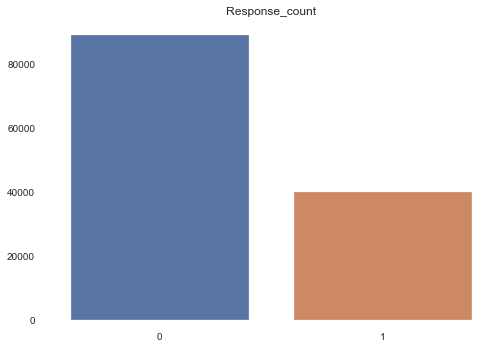

In [72]:
values, counts = np.unique(resampled_y_train, return_counts=True)
for i in range(len(values)):
    print(f'Class {values[i]} count:  {counts[i]}')
    
    
    
    sns.barplot(x=values, y=counts)
plt.title('Response_count')

In [73]:
resampled_X_train.shape

(129314, 8)

In [74]:
resampled_y_train.shape

(129314,)

In [75]:
resampled_results = pd.DataFrame({"Model":None,"Train F1":None,"Test F1":None,"CV Mean F1":None,"CV std in scores":None},index=range(0,3))

## Creating models with resampled data

### Naive Bayes (Bernoulli)

In [76]:
nb_3 = BernoulliNB().fit(resampled_X_train, resampled_y_train)
train_nb_3_f1 = f1_score(resampled_y_train, nb_3.predict(resampled_X_train))
test_nb_3_f1 = f1_score(y_test, nb_3.predict(X_test))

print("Training f1:", train_nb_3_f1)
print("Testing f1:", test_nb_3_f1)

print()
print("Model Performance Report on Train")
print(classification_report(resampled_y_train, nb_3.predict(resampled_X_train)))

print("Model Performance Report on Test")
print(classification_report(y_test, nb_3.predict(X_test)))

nb_3_cv = cross_val_score(BernoulliNB(), resampled_X_train, resampled_y_train, cv=3, scoring="f1")
print("Mean of f1 scores:", nb_3_cv.mean())
print("Deviation in f1 scores:", nb_3_cv.std())
results.iloc[0,0] = "Resampled Naive Bayes (Bernoulli)"
results.iloc[0,1] = train_nb_3_f1
results.iloc[0,2] = test_nb_3_f1
results.iloc[0,3] = nb_3_cv.mean()
results.iloc[0,4] = nb_3_cv.std()


Training f1: 0.6670062727236407
Testing f1: 0.4202143454903761

Model Performance Report on Train
              precision    recall  f1-score   support

           0       0.90      0.70      0.79     89182
           1       0.56      0.83      0.67     40132

    accuracy                           0.74    129314
   macro avg       0.73      0.77      0.73    129314
weighted avg       0.80      0.74      0.75    129314

Model Performance Report on Test
              precision    recall  f1-score   support

           0       0.97      0.70      0.81     66846
           1       0.28      0.83      0.42      9376

    accuracy                           0.72     76222
   macro avg       0.62      0.77      0.62     76222
weighted avg       0.88      0.72      0.77     76222

Mean of f1 scores: 0.6670114592411642
Deviation in f1 scores: 0.003037034895937139


There is an improvement from the performance of the model on the original data. The Naive Bayes (Bernoulli) model gave an F1 score of 0.420 on the test data and an average F1 score of 0.667.

### Random Forest

In [77]:
rfc_2 = RandomForestClassifier().fit(resampled_X_train, resampled_y_train)
train_rfc_2_f1 = f1_score(resampled_y_train, rfc_2.predict(resampled_X_train))
test_rfc_2_f1 = f1_score(y_test, rfc_2.predict(X_test))

print("Training f1:", train_rfc_2_f1)
print("Testing f1:", test_rfc_2_f1)

print()
print("Model Performance Report on Train")
print(classification_report(resampled_y_train, rfc_2.predict(resampled_X_train)))

print("Model Performance Report on Test")
print(classification_report(y_test, rfc_2.predict(X_test)))

rfc_2_cv = cross_val_score(RandomForestClassifier(), resampled_X_train, resampled_y_train, cv=3, scoring="f1")
print("Mean of f1 scores:", rfc_2_cv.mean())
print("Deviation in f1 scores:", rfc_2_cv.std())
results.iloc[0,0] = "Resampled Random Forest"
results.iloc[0,1] = train_rfc_2_f1
results.iloc[0,2] = test_rfc_2_f1
results.iloc[0,3] = rfc_2_cv.mean()
results.iloc[0,4] = rfc_2_cv.std()


Training f1: 0.9999003264309387
Testing f1: 0.39472602995555217

Model Performance Report on Train
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     89182
           1       1.00      1.00      1.00     40132

    accuracy                           1.00    129314
   macro avg       1.00      1.00      1.00    129314
weighted avg       1.00      1.00      1.00    129314

Model Performance Report on Test
              precision    recall  f1-score   support

           0       0.93      0.82      0.87     66846
           1       0.30      0.56      0.39      9376

    accuracy                           0.79     76222
   macro avg       0.62      0.69      0.63     76222
weighted avg       0.85      0.79      0.81     76222

Mean of f1 scores: 0.6095693976172528
Deviation in f1 scores: 0.012572591111688186


We also notice an improvement from the performance of the model on the original data. The Random Forest model gave an F1 score of 0.393 on the test data and an average F1 score of 0.608.

### Decision Tree

In [78]:
dt_2 = DecisionTreeClassifier().fit(resampled_X_train, resampled_y_train)
train_dt_2_f1 = f1_score(resampled_y_train, dt_2.predict(resampled_X_train))
test_dt_2_f1 = f1_score(y_test, dt_2.predict(X_test))

print("Training f1:", train_dt_2_f1)
print("Testing f1:", test_dt_2_f1)

print()
print("Model Performance Report on Train")
print(classification_report(resampled_y_train, dt_2.predict(resampled_X_train)))

print("Model Performance Report on Test")
print(classification_report(y_test, dt_2.predict(X_test)))

dt_2_cv = cross_val_score(DecisionTreeClassifier(), resampled_X_train, resampled_y_train, cv=3, scoring="f1")
print("Mean of f1 scores:", dt_2_cv.mean())
print("Deviation in f1 scores:", dt_2_cv.std())
results.iloc[0,0] = "Resampled Decision Tree"
results.iloc[0,1] = train_dt_2_f1
results.iloc[0,2] = test_dt_2_f1
results.iloc[0,3] = dt_2_cv.mean()
results.iloc[0,4] = dt_2_cv.std()


Training f1: 1.0
Testing f1: 0.3664913818288052

Model Performance Report on Train
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     89182
           1       1.00      1.00      1.00     40132

    accuracy                           1.00    129314
   macro avg       1.00      1.00      1.00    129314
weighted avg       1.00      1.00      1.00    129314

Model Performance Report on Test
              precision    recall  f1-score   support

           0       0.93      0.81      0.86     66846
           1       0.28      0.54      0.37      9376

    accuracy                           0.77     76222
   macro avg       0.60      0.67      0.61     76222
weighted avg       0.85      0.77      0.80     76222

Mean of f1 scores: 0.579037000482845
Deviation in f1 scores: 0.01686902748114585


The Decision Tree model gave an F1 score of 0.365 on the test data and a mean F1 score of 0.578 which is also an improvement from the performance of the model on the original data. 

In [79]:
resampled_results

,Model,Train F1,Test F1,CV Mean F1,CV std in scores
0,None,None,None,None,None
1,None,None,None,None,None
2,None,None,None,None,None


The Naive Bayes (Bernoulli) model, again, gave the highest F1 scores of 0.667 and 0.420 on training and testing data respectively, with a mean F1 score of 0.667, although it produced very low precision for class 1 on test data, which is, 0.28 compared to recall of 0.83.

Random Forest and Decision Tree, which both have slightly lesser differences in recall and precision scores in test samples were second and third best performing models in terms of F1 respectively.

Tree-based algorithms are prone to overfitting and the deviation in cross validation scores was close to 1.7% for Decision Tree and 1.3% for Random Forest compared to just 0.3% by Naive Bayes (Bernoulli), which generalized better and provided the most consistent results.

Since, Naive Bayes (Bernoulli) gave the highest F1 score and less time consuming due to being a standalone estimator, we will choose the Naive Bayes (Bernoulli) for further tuning.

## Feature Selection

In [80]:
features_results = pd.DataFrame({"Model" : None, "Train F1" : None, "Test F1" : None, "CV Mean F1" : None, "CV std in scores":None}, index=range(0,2))

To determine the best set of features for Naive Bayes (Bernoulli), we will be using the following techniques

###### Recursive Feature Elimination

In [81]:
ranking = np.array([ 1,  1,  1, 15,  1,  1, 12, 5])
ranking

array([ 1,  1,  1, 15,  1,  1, 12,  5])

In [82]:
print("Best Features:", resampled_X_train.columns[ranking == 1])

Best Features: Index(['id', 'Gender', 'Age', 'Previously_Insured', 'Vehicle_Age'], dtype='object')


Training f1: 0.6527508745554944
Testing f1: 0.3989793082539603

Model Performance Report on Train
              precision    recall  f1-score   support

           0       0.90      0.67      0.77     89182
           1       0.53      0.84      0.65     40132

    accuracy                           0.72    129314
   macro avg       0.72      0.76      0.71    129314
weighted avg       0.79      0.72      0.73    129314


Mean of f1 scores: 0.6527557791620141
Deviation in f1 scores: 0.0028211004885673133

Model Performance Report on Test
              precision    recall  f1-score   support

           0       0.97      0.67      0.79     66846
           1       0.26      0.84      0.40      9376

    accuracy                           0.69     76222
   macro avg       0.61      0.75      0.59     76222
weighted avg       0.88      0.69      0.74     76222



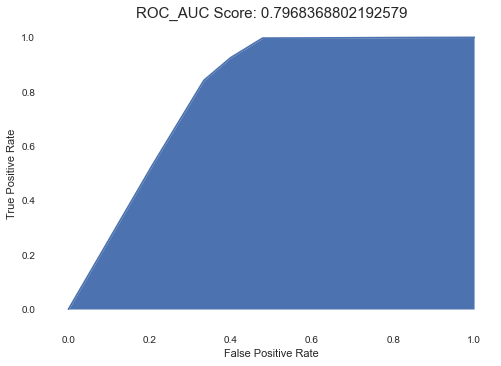

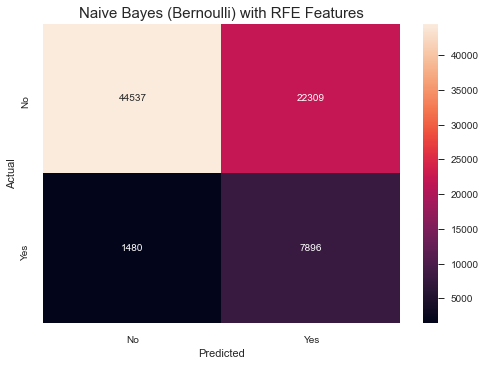

In [83]:
features =  resampled_X_train.columns[ranking == 1]

nb_3_rfe = BernoulliNB().fit(resampled_X_train[list(features)], resampled_y_train)
train_nb_3_rfe_f1 = f1_score(resampled_y_train, nb_3_rfe.predict(resampled_X_train[list(features)]))
test_nb_3_rfe_f1 = f1_score(y_test, nb_3_rfe.predict(X_test[list(features)]))

print("Training f1:", train_nb_3_rfe_f1)
print("Testing f1:", test_nb_3_rfe_f1)

print()
print("Model Performance Report on Train")
print(classification_report(resampled_y_train, nb_3_rfe.predict(resampled_X_train[list(features)])))
print()
nb_3_rfe_cv = cross_val_score(BernoulliNB(), resampled_X_train[list(features)], resampled_y_train, cv=3, scoring="f1")
print("Mean of f1 scores:", nb_3_rfe_cv.mean())
print("Deviation in f1 scores:",nb_3_rfe_cv.std())
features_results.iloc[0,0] = "Recursive Feature Elimination"
features_results.iloc[0,1] = train_nb_3_rfe_f1
features_results.iloc[0,2] = test_nb_3_rfe_f1
features_results.iloc[0,3] = nb_3_rfe_cv.mean()
features_results.iloc[0,4] = nb_3_rfe_cv.std()
print()
print("Model Performance Report on Test")
print(classification_report(y_test, nb_3_rfe.predict(X_test[list(features)])))

fpr, tpr, thres = roc_curve(y_test, nb_3_rfe.predict_proba(X_test[list(features)])[:,1])
plt.plot(fpr, tpr)
plt.fill_between(fpr, tpr)
plt.title(f"ROC_AUC Score: {roc_auc_score(y_test, nb_3_rfe.predict_proba(X_test[list(features)])[:,1])}", size=15)
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.show()

sns.heatmap(confusion_matrix(y_test, nb_3_rfe.predict(X_test[list(features)])), annot=True,fmt="g")
plt.title("Naive Bayes (Bernoulli) with RFE Features", size=15)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.xticks([0.5,1.5],["No","Yes"])
plt.yticks([0.5,1.5],["No","Yes"])
plt.show()

Using Recursive Feature Elimination, Naive Bayes (Bernoulli) has an ROC_AUC score of 79.68.

###### Forward Feature Elimination

In [84]:
ffe_features = ['id',
 'Age',
 'Gender',
 'Previously_Insured',
 'Vehicle_Age',
 'Vehicle_Damage',
 'Region_Code',
 'Policy_Sales_Channel']

ffe_features

['id',
 'Age',
 'Gender',
 'Previously_Insured',
 'Vehicle_Age',
 'Vehicle_Damage',
 'Region_Code',
 'Policy_Sales_Channel']

Training f1: 0.6670062727236407
Testing f1: 0.4202143454903761

Model Performance Report on Train
              precision    recall  f1-score   support

           0       0.90      0.70      0.79     89182
           1       0.56      0.83      0.67     40132

    accuracy                           0.74    129314
   macro avg       0.73      0.77      0.73    129314
weighted avg       0.80      0.74      0.75    129314


Mean of f1 scores: 0.6670114592411642
Deviation in f1 scores: 0.003037034895937139

Model Performance Report on Test
              precision    recall  f1-score   support

           0       0.97      0.70      0.81     66846
           1       0.28      0.83      0.42      9376

    accuracy                           0.72     76222
   macro avg       0.62      0.77      0.62     76222
weighted avg       0.88      0.72      0.77     76222



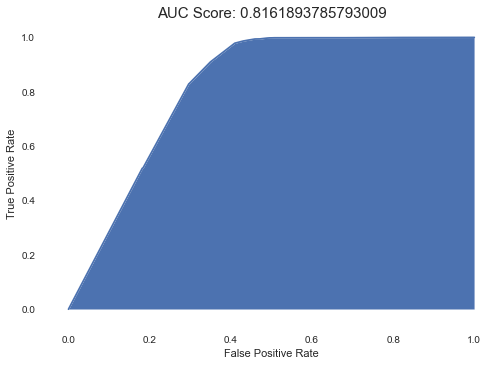

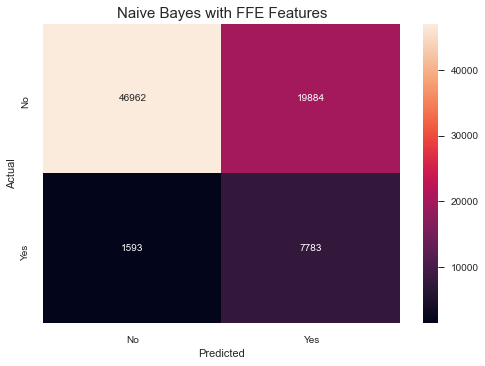

In [85]:
nb_3_ffe = BernoulliNB().fit(resampled_X_train[list(ffe_features)], resampled_y_train)
train_nb_3_ffe_f1 = f1_score(resampled_y_train, nb_3_ffe.predict(resampled_X_train[list(ffe_features)]))
test_nb_3_ffe_f1 = f1_score(y_test, nb_3_ffe.predict(X_test[list(ffe_features)]))

print("Training f1:", train_nb_3_ffe_f1)
print("Testing f1:", test_nb_3_ffe_f1)

print()
print("Model Performance Report on Train")
print(classification_report(resampled_y_train, nb_3_ffe.predict(resampled_X_train[list(ffe_features)])))
print()
nb_3_ffe_cv = cross_val_score(BernoulliNB(), resampled_X_train[list(ffe_features)], resampled_y_train, cv=3,scoring="f1")
print("Mean of f1 scores:", nb_3_ffe_cv.mean())
print("Deviation in f1 scores:", nb_3_ffe_cv.std())
features_results.iloc[1,0] = "Forward Feature Elimination"
features_results.iloc[1,1] = train_nb_3_ffe_f1
features_results.iloc[1,2] = test_nb_3_ffe_f1
features_results.iloc[1,3] = nb_3_ffe_cv.mean()
features_results.iloc[1,4] = nb_3_ffe_cv.std()
print()
print("Model Performance Report on Test")
print(classification_report(y_test, nb_3_ffe.predict(X_test[list(ffe_features)])))

fpr, tpr, thres = roc_curve(y_test, nb_3_ffe.predict_proba(X_test[list(ffe_features)])[:,1])
plt.plot(fpr, tpr)
plt.fill_between(fpr, tpr)
plt.title(f"AUC Score: {roc_auc_score(y_test, nb_3_ffe.predict_proba(X_test[list(ffe_features)])[:,1])}",size=15)
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.show()

sns.heatmap(confusion_matrix(y_test, nb_3_ffe.predict(X_test[list(ffe_features)])), annot=True, fmt="g")
plt.title("Naive Bayes with FFE Features",size=15)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.xticks([0.5,1.5],["No","Yes"])
plt.yticks([0.5,1.5],["No","Yes"])
plt.show()

Forward Feature Elimination yielded an ROC_AUC score of 81.62

In [86]:
features_results

,Model,Train F1,Test F1,CV Mean F1,CV std in scores
0,Recursive Feature Elimination,0.652751,0.398979,0.652756,0.0028211
1,Forward Feature Elimination,0.667006,0.420214,0.667011,0.00303703


The Naive Bayes (Bernoulli) model gave higher F1 scores of 0.667 and 0.420 on train and test samples respectively, using Forward Feature Elimination. The model, however, had a higher deviation in scores for Forward Feature Elimination (0.30%) than for Recursive Feature Elimination (0.28%).

The model also had a higher ROC_AUC score of 81.62 for Forward Feature Elimination than for Recursive Feature Elimination (79.68). 

Hence we will pick the Naive Bayes (Bernoulli) model with set of features determined by Forward Feature Elimination.

### Saving The Model

In [87]:
model = pickle.dump(nb_3_ffe, open("model.pkl", "wb"))

### Applying Model to Data

In [88]:
testing = insurance_data_test.loc[:,['id', 'Gender', 'Age', 'Driving_License', 'Region_Code', 'Previously_Insured', 'Vehicle_Age', 'Policy_Sales_Channel']]


In [89]:
testing_data = pd.get_dummies(testing)

In [90]:
testing_data.columns

Index(['id', 'Gender', 'Age', 'Driving_License', 'Region_Code',
       'Previously_Insured', 'Vehicle_Age', 'Policy_Sales_Channel'],
      dtype='object')

In [91]:
 response = nb_3_ffe.predict(testing_data)

In [92]:
len(response)

127037

In [93]:
testing_data.shape

(127037, 8)

In [94]:
testing_data['Response'] = response

In [95]:
viewing_testing = testing_data.loc[:,['id','Response']]

In [96]:
viewing_testing

,id,Response
0,381110,0
1,381111,0
2,381112,0
3,381113,0
4,381114,0
...,...,...
127032,508142,0
127033,508143,0
127034,508144,0
127035,508145,0


# Business Interpretation of the Model

Only about 13% of over 380,000 health insurance customers in the original dataset gave a positive response as to whether they would like to purchase an auto insurance through the company. SUCH IMBALANCE!

After in-depth analysis of all features, we have created a Naive Bayes (Bernoulli) model to predict which health insurance customers would be interested in purchasing vehicle insurance from the company.

The following are key insights about the model:

The most useful features for identifying potential vehicle insurance customers were chosen to create the models in this project. These features can be the major target points for the company when trying to identify potential auto insurance customers. The used features include:

1. Vehicle Damage.
2. Age.
3. Previously Insured.
4. Gender
5. Region Code, preferably 28, 152 or 8.
6. Policy Sales channel, preferably 26, 124 or 152.
7. Vehicle Age.
8. Customer Id

Based on the chosen target features, the final model had an F1 score of 0.67 on the training data and an F1 score of 0.42 on test data, with an ROC_AUC score of 81.62. The model was very reliable and produced consistent results, based on a deviation in f1 scores across several test samples calculated to only about 0.3%.

During testing, the model gave a AUC score of 81.62, which is a good score.

The project was not without some challenges though as the model experienced some limitations, amongst which is a huge difference in the test and train scores of the model, which indicates underfitting and was a problem across almost all models that were built due to the high imbalance in instances of health insurance customers who have auto insurance and those who did not.

After resampling the data for the classes of customers in the training sample, the models performed better than they did on the original data with results for the test set significantly increasing.

However, while the scores during the test phase had improved significantly, there was still huge difference in the train and test results.

# Recommendation

So, based on the findings of this project, my recommendations are that male customers who have driver's licences, who are between mid-thirties and mid-fifties, who have had their vehicles damaged at some point, who do not currently have their vehicles insured, whose vehicles are aged between one and two years, and got their insurance through channels 152, 26 and 124 especially those from regions 28 and 8, are our likely potential auto insurance customers.

# Suggestion For Improvement

More data of health and auto insurance customers should be added to the data to avoid high data imbalance. This will greatly improve the model and help get better results during testing. Also, level of contribution of customer age to vehicle damage could be checked. That is, what age groups have damaged the most and least vehicles. Some other sophisticated or high-level classification models should also be used on the data to see if they will make better predictions.